In [308]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df1 = pd.read_csv("co2.csv")

# **Preprocessing data**

In [309]:
df1.head(5)

,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
0,ACURA,ILX,COMPACT,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,ACURA,ILX,COMPACT,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,ACURA,ILX HYBRID,COMPACT,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS6,Z,12.1,8.7,10.6,27,244


In [310]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7385 entries, 0 to 7384
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Make                              7385 non-null   object 
 1   Model                             7385 non-null   object 
 2   Vehicle Class                     7385 non-null   object 
 3   Engine Size(L)                    7385 non-null   float64
 4   Cylinders                         7385 non-null   int64  
 5   Transmission                      7385 non-null   object 
 6   Fuel Type                         7385 non-null   object 
 7   Fuel Consumption City (L/100 km)  7385 non-null   float64
 8   Fuel Consumption Hwy (L/100 km)   7385 non-null   float64
 9   Fuel Consumption Comb (L/100 km)  7385 non-null   float64
 10  Fuel Consumption Comb (mpg)       7385 non-null   int64  
 11  CO2 Emissions(g/km)               7385 non-null   int64  
dtypes: flo

In [311]:
df1.isna().sum().sum()

0

In [312]:
df1['Vehicle Class'].unique()

array(['COMPACT', 'SUV - SMALL', 'MID-SIZE', 'TWO-SEATER', 'MINICOMPACT',
       'SUBCOMPACT', 'FULL-SIZE', 'STATION WAGON - SMALL',
       'SUV - STANDARD', 'VAN - CARGO', 'VAN - PASSENGER',
       'PICKUP TRUCK - STANDARD', 'MINIVAN', 'SPECIAL PURPOSE VEHICLE',
       'STATION WAGON - MID-SIZE', 'PICKUP TRUCK - SMALL'], dtype=object)

In [313]:
df1['Fuel Type'].unique()

array(['Z', 'D', 'X', 'E', 'N'], dtype=object)

In [314]:
df1['Transmission'].unique()

array(['AS5', 'M6', 'AV7', 'AS6', 'AM6', 'A6', 'AM7', 'AV8', 'AS8', 'A7',
       'A8', 'M7', 'A4', 'M5', 'AV', 'A5', 'AS7', 'A9', 'AS9', 'AV6',
       'AS4', 'AM5', 'AM8', 'AM9', 'AS10', 'A10', 'AV10'], dtype=object)

In [315]:
# Check the data type of the 'horsepower' column
df1['Engine Size(L)'].dtype

dtype('float64')

# **📦 Feature Selection: Dropping Redundant or Non-Contributing Columns**


In [316]:
columns_to_drop = ['Make', 'Model', 'Vehicle Class', 'Transmission', 'Fuel Type','Fuel Consumption Comb (mpg)']
df = df1.copy()
df = df.drop(columns=columns_to_drop)

df.head(5)

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),CO2 Emissions(g/km)
0,2.0,4,9.9,6.7,8.5,196
1,2.4,4,11.2,7.7,9.6,221
2,1.5,4,6.0,5.8,5.9,136
3,3.5,6,12.7,9.1,11.1,255
4,3.5,6,12.1,8.7,10.6,244


In [317]:
df1.head(5)

,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
0,ACURA,ILX,COMPACT,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,ACURA,ILX,COMPACT,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,ACURA,ILX HYBRID,COMPACT,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS6,Z,12.1,8.7,10.6,27,244


### **🧠 Why Drop These Columns?**

Below is a breakdown of why each of these columns was removed, along with the reasoning behind the decision.

🔧 Make and Model
These are high-cardinality categorical variables.

Although certain makes/models could impact CO₂ emissions (e.g., based on design, performance, or technology), their effects are already captured through numerical features like:

Engine size

Number of cylinders

Fuel consumption metrics

Including them would introduce unnecessary complexity for linear models and may lead to overfitting without meaningful gain.

🚗 Vehicle Class
The vehicle class is typically a proxy for size, weight, and aerodynamics — all of which directly impact emissions.

However, we already include fuel consumption values in city, highway, and combined modes, which serve as direct indicators of energy usage.

Therefore, class adds little additional value to the prediction task.

⚠️ Note: The dataset does not include high-emission categories like "sports" or "performance" cars. The "SPECIAL PURPOSE VEHICLE" class is ambiguous and undefined, making it difficult to interpret or use.

⚙️ Transmission and Fuel Type
Both affect how efficiently a vehicle uses fuel.

But again, we already directly observe fuel consumption — which is the more useful, quantitative result of these design choices.

Keeping these would be redundant and potentially misleading in a linear model.

🔁 Fuel Consumption Comb (mpg)
This is a direct conversion of Fuel Consumption Comb (L/100 km), which is already in the dataset.

Keeping both would introduce perfect multicollinearity.

Since this dataset is based in Canada, we retain the liters per 100 km metric and drop the MPG version.

✅ Final Feature Set
After dropping the above columns, we are left with a clean, compact set of numerical features that directly affect CO₂ emissions:

Engine Size (L)

Cylinders

Fuel Consumption City (L/100 km)

Fuel Consumption Hwy (L/100 km)

Fuel Consumption Comb (L/100 km)

These features are:

Quantitative

Strongly predictive

Free of redundancy

💡 Optional idea: It’s possible to train separate models by vehicle class (e.g., SUVs, trucks, minivans), which could reveal unique relationships. However, for now, we use a general model to keep the approach simple and robust.

# **EDA**

In [318]:
from scipy.stats import skew, kurtosis
target_var = 'CO2 Emissions(g/km)'

## **Target Variable**

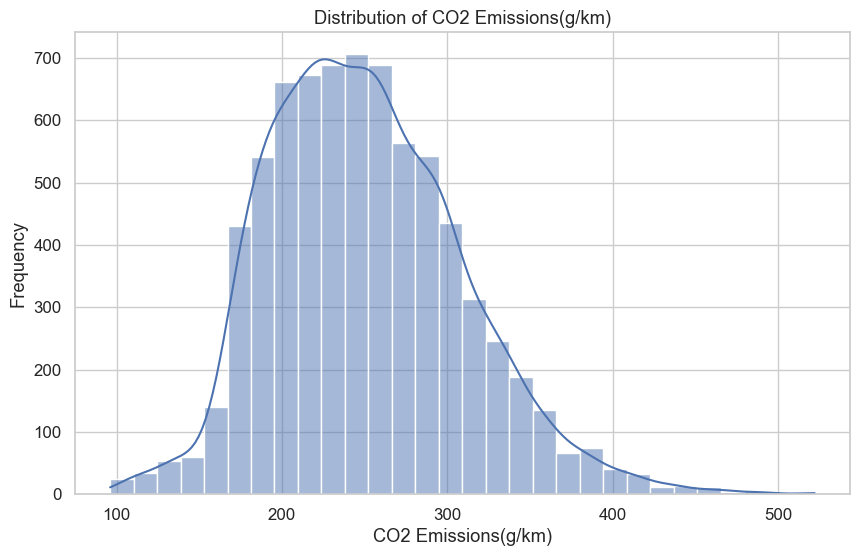

In [319]:
#Plotting    Histogram and KDE
plt.figure(figsize=(10, 6))
sns.histplot(df[target_var], kde=True, bins=30)
plt.title(f'Distribution of {target_var}')
plt.xlabel(target_var)
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [320]:
summary_stats = df[target_var].describe()
median = df[target_var].median()
print("📐 Summary Statistics:")
print(summary_stats)
print(f"Median: {median:.2f}")

📐 Summary Statistics:
count    7385.000000
mean      250.584699
std        58.512679
min        96.000000
25%       208.000000
50%       246.000000
75%       288.000000
max       522.000000
Name: CO2 Emissions(g/km), dtype: float64
Median: 246.00


In [321]:
target_skewness = skew(df[target_var])
target_kurtosis = kurtosis(df[target_var])

print("\n🧮 Skewness and Kurtosis:")
print(f"Skewness: {target_skewness:.2f}  (0 = symmetric)")
print(f"Kurtosis: {target_kurtosis:.2f}  (3 = normal distribution)")


🧮 Skewness and Kurtosis:
Skewness: 0.53  (0 = symmetric)
Kurtosis: 0.48  (3 = normal distribution)


## **Features**

Feature: Engine Size(L)
  Skewness : 0.809
  Kurtosis : -0.133


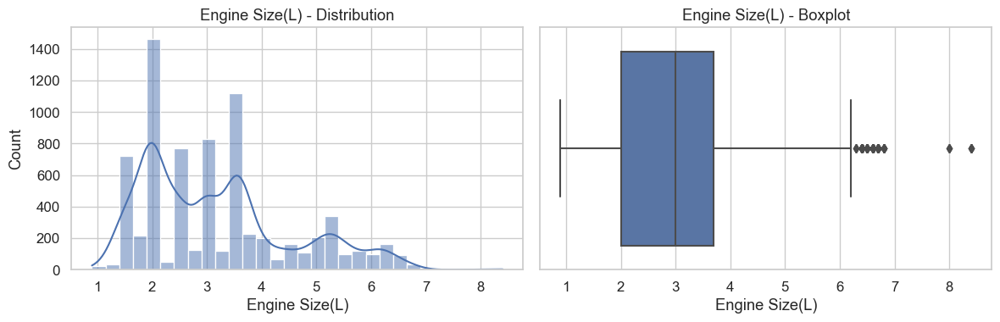

Feature: Cylinders
  Skewness : 1.110
  Kurtosis : 1.523


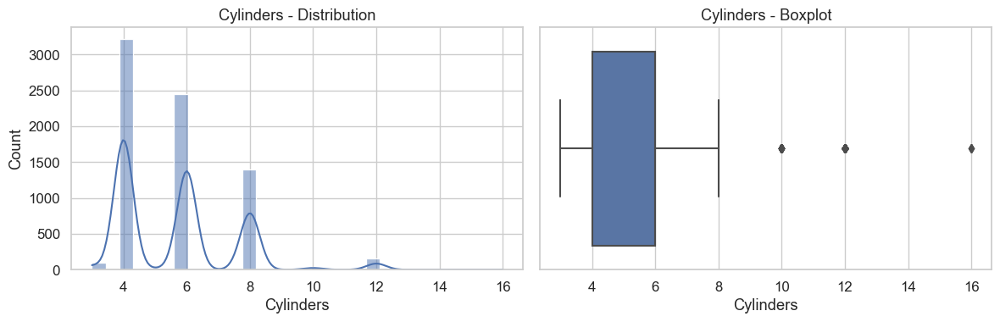

Feature: Fuel Consumption City (L/100 km)
  Skewness : 0.809
  Kurtosis : 1.195


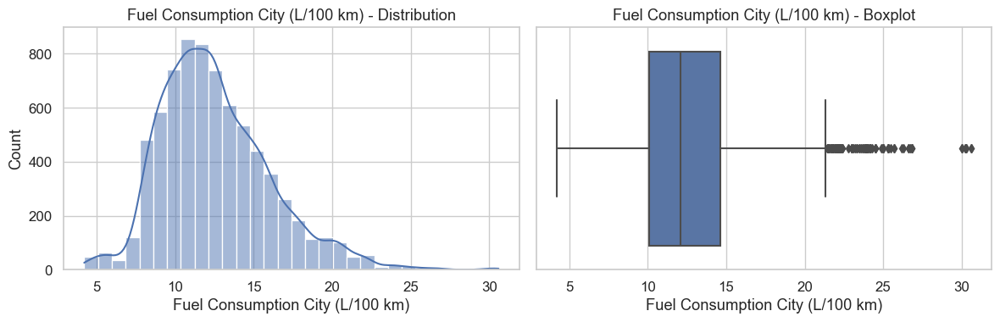

Feature: Fuel Consumption Hwy (L/100 km)
  Skewness : 1.079
  Kurtosis : 2.007


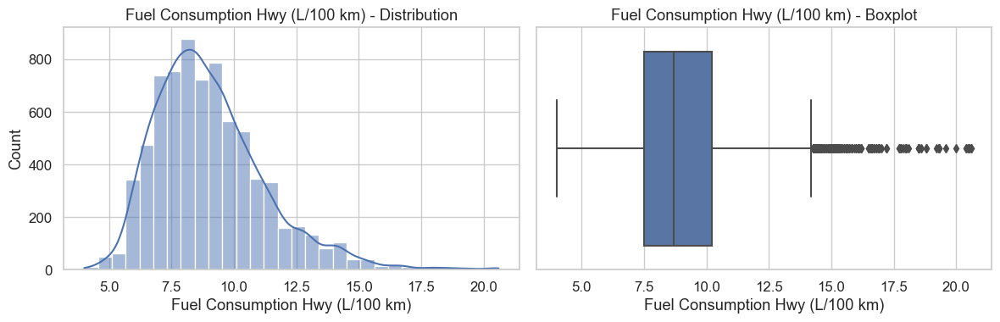

Feature: Fuel Consumption Comb (L/100 km)
  Skewness : 0.893
  Kurtosis : 1.392


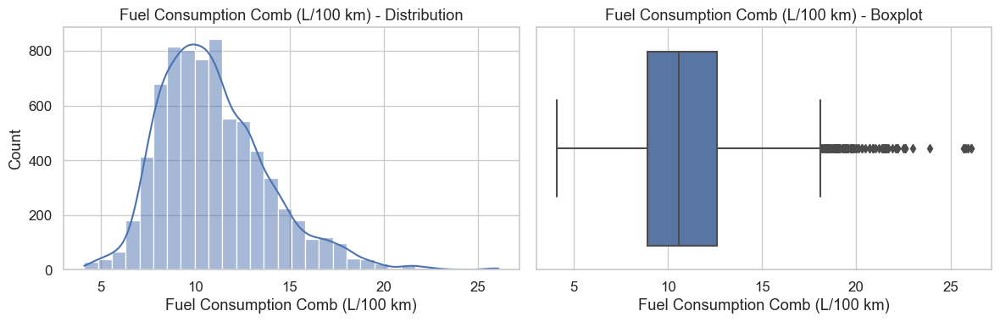

In [322]:
for col in df.drop(columns=target_var).select_dtypes(include=['float64', 'int64']):
    plt.figure(figsize=(12, 4))
    
    # Histogram + KDE
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f'{col} - Distribution')
    
    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col])
    plt.title(f'{col} - Boxplot')
    
    # Print stats
    print(f"Feature: {col}")
    print(f"  Skewness : {skew(df[col]):.3f}")
    print(f"  Kurtosis : {kurtosis(df[col]):.3f}")
    plt.tight_layout()
    plt.show()

1. Engine Size (L)	⚠️ Moderate Right skew , Mild Outlier | log-transform

2. Cylinders	⚠️ Right-skewed , Discrete , Heavy tails | one-hot encode.
3. Fuel Consumption City (L/100 km)	⚠️ Moderate right skew, Mild outliers | log-transform.

4. Fuel Consumption Hwy (L/100 km) ⚠️ Stronger skew, heavier tails | log-transform.

5. Fuel Consumption Combined (L/100 km) ⚠️ Right-skewed, important target proxy | log-transform

Note : These will definetly be Z-score scaled before the model is trained.

Checking how model works with the features.

In [323]:
df['Engine_Size_log'] = np.log1p(df['Engine Size(L)'])
df['Cylinders_encoded'] = df['Cylinders']
df['Fuel_City_log'] = np.log1p(df['Fuel Consumption City (L/100 km)'])
df['Fuel_Hwy_log'] = np.log1p(df['Fuel Consumption Hwy (L/100 km)'])
df['Fuel_Comb_log'] = np.log1p(df['Fuel Consumption Comb (L/100 km)'])

df = pd.get_dummies(df, columns=['Cylinders'], drop_first=True)


df_clean = df.drop(columns=['Engine Size(L)','Cylinders_encoded','Fuel Consumption City (L/100 km)',
                          'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)'])

bool_cols = df_clean.select_dtypes(include='bool').columns
df_clean[bool_cols] = df_clean[bool_cols].astype(int)


df_clean.head(5)

,CO2 Emissions(g/km),Engine_Size_log,Fuel_City_log,Fuel_Hwy_log,Fuel_Comb_log,Cylinders_4,Cylinders_5,Cylinders_6,Cylinders_8,Cylinders_10,Cylinders_12,Cylinders_16
0,196,1.098612,2.388763,2.041220,2.251292,1,0,0,0,0,0,0
1,221,1.223775,2.501436,2.163323,2.360854,1,0,0,0,0,0,0
2,136,0.916291,1.945910,1.916923,1.931521,1,0,0,0,0,0,0
3,255,1.504077,2.617396,2.312535,2.493205,0,0,1,0,0,0,0
4,244,1.504077,2.572612,2.272126,2.451005,0,0,1,0,0,0,0


In [324]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error


columns_to_drop = ['CO2 Emissions(g/km)']
X = df_clean.drop(columns=columns_to_drop)
y = df_clean['CO2 Emissions(g/km)']


In [325]:

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Z-score scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # fit only on train
X_test_scaled = scaler.transform(X_test)        # transform test

# Model
model = LinearRegression()
model.fit(X_train_scaled, y_train)

# Predict & evaluate
y_pred = model.predict(X_test_scaled)
print("R² Score:", r2_score(y_test, y_pred))
print("MSE:", mean_squared_error(y_test, y_pred))


R² Score: 0.9020490762782697
MSE: 336.91468251215014


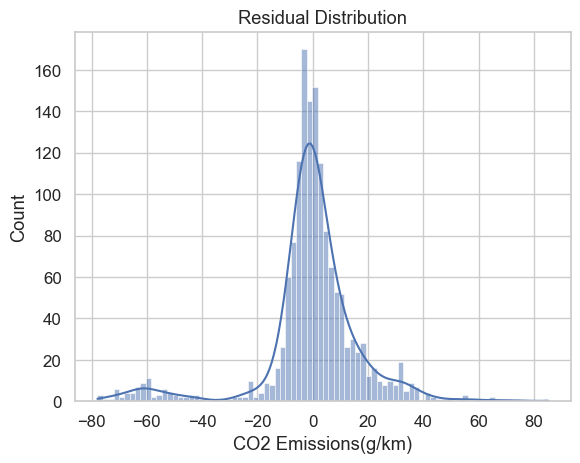

In [326]:
residuals = y_test - y_pred
sns.histplot(residuals, kde=True)
plt.title("Residual Distribution")
plt.show()


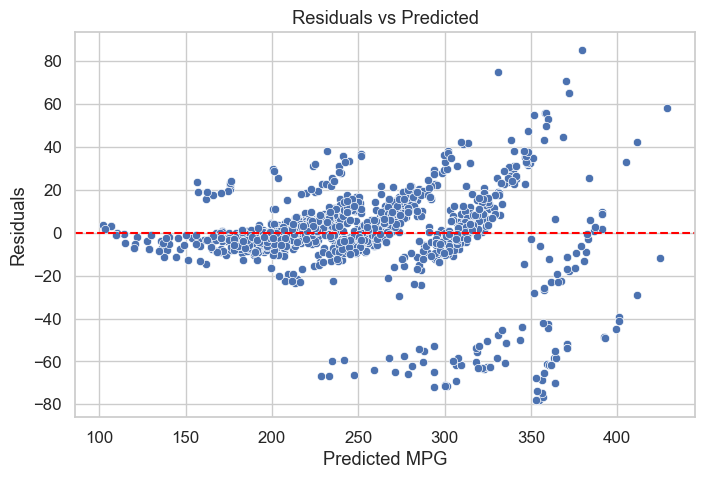

In [327]:
residuals = y_test - y_pred

plt.figure(figsize=(8, 5))
sns.scatterplot(x=y_pred, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted MPG")
plt.ylabel("Residuals")
plt.title("Residuals vs Predicted")
plt.show()


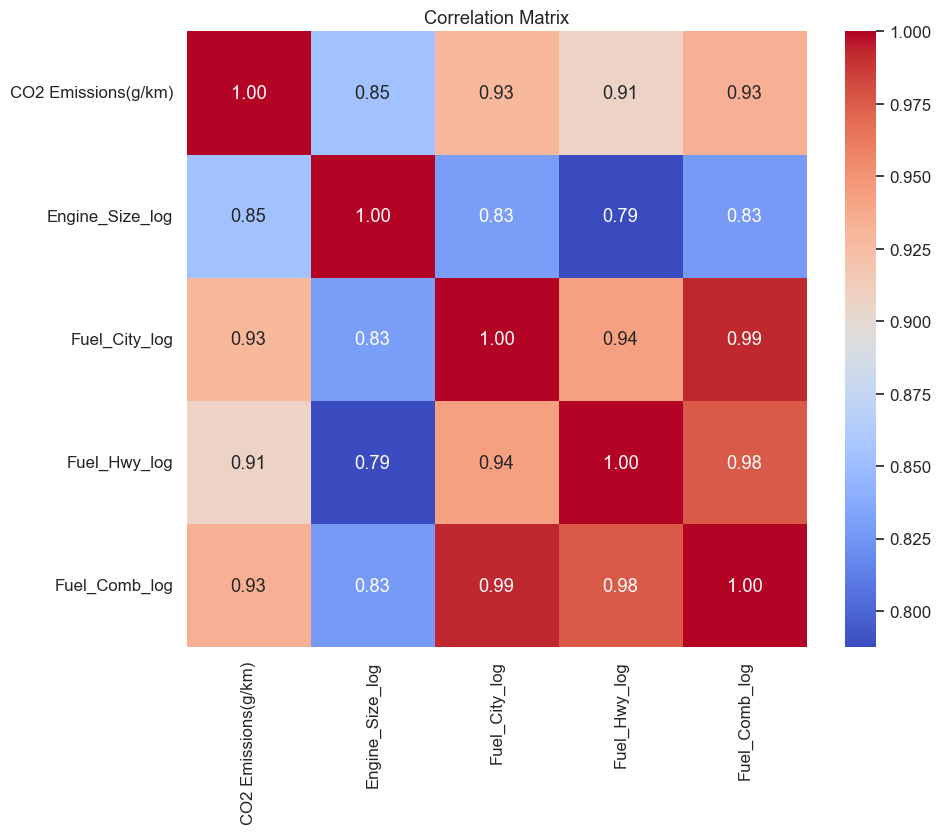

In [328]:
# Drop non-numeric columns just in case (like 'car name')
numeric_df = df_clean.select_dtypes(include=['float64', 'int64'])

plt.figure(figsize=(10, 8))
sns.heatmap(numeric_df.corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

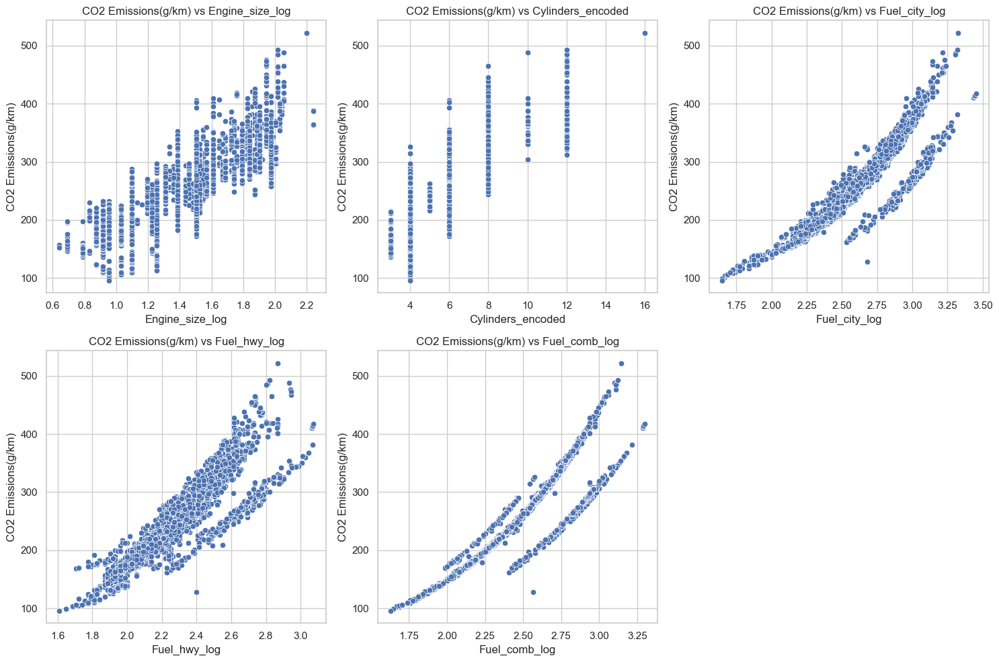

In [329]:
features = ['Engine_Size_log', 'Cylinders_encoded', 
            'Fuel_City_log', 'Fuel_Hwy_log', 'Fuel_Comb_log']

# Set plot style
sns.set(style='whitegrid')

fig, axs = plt.subplots(2, 3, figsize=(15, 10))
axs = axs.flatten()

for i, feature in enumerate(features):
    sns.scatterplot(x=df[feature], y=df_clean['CO2 Emissions(g/km)'], ax=axs[i])
    axs[i].set_title(f'CO2 Emissions(g/km) vs {feature.capitalize()}')
    axs[i].set_xlabel(feature.capitalize())
    axs[i].set_ylabel('CO2 Emissions(g/km)')

# Hide any unused subplot
for j in range(len(features), len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

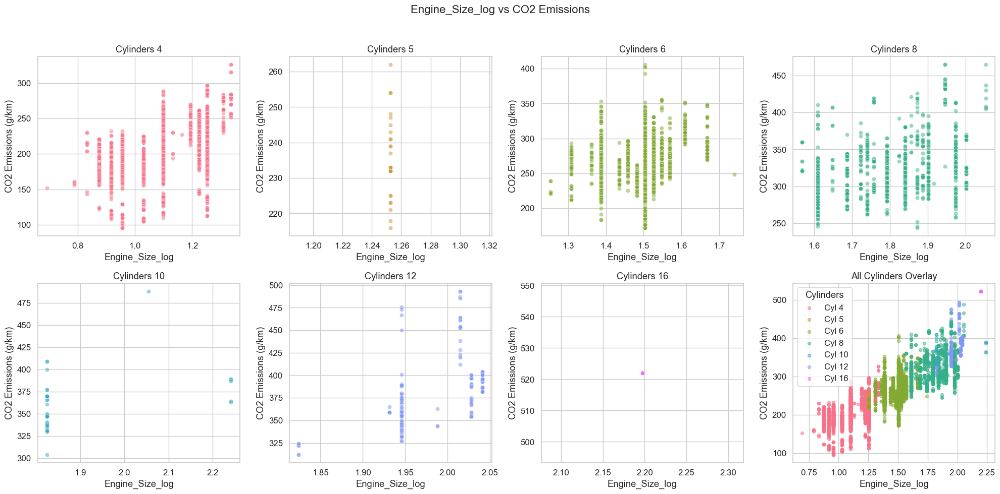

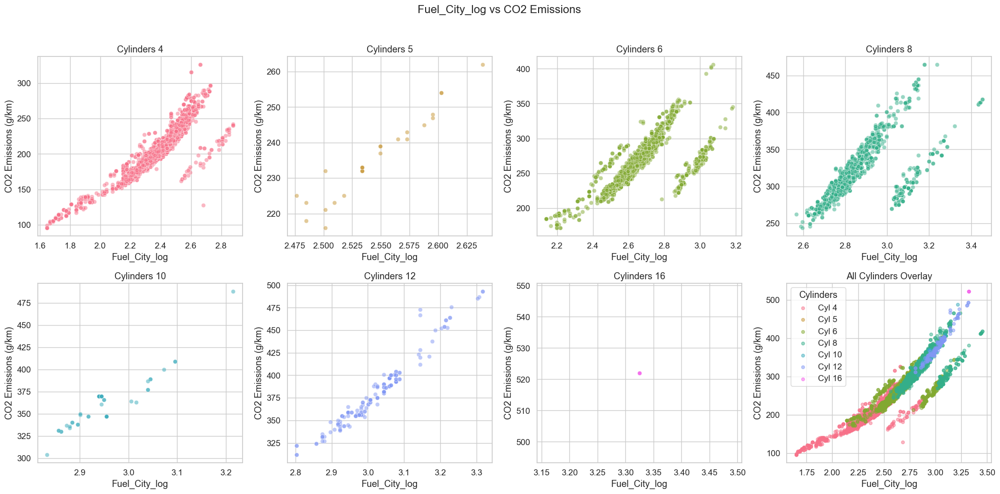

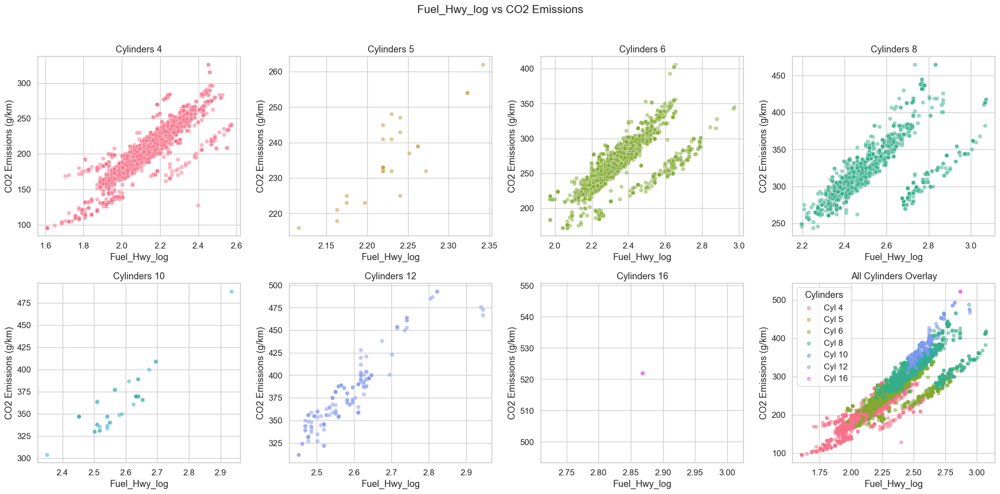

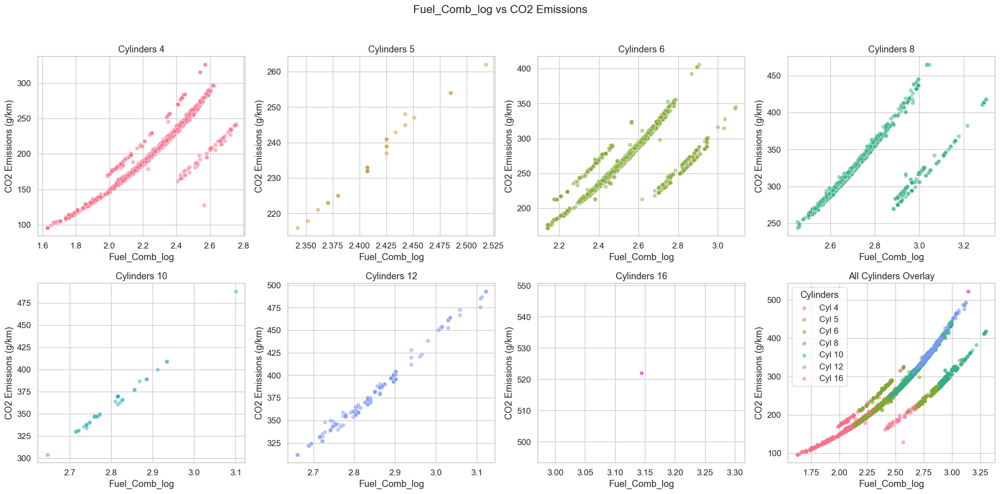

In [330]:
sns.set(style="whitegrid", font_scale=1.1)

# Features to plot against CO2
features = ['Engine_Size_log','Fuel_City_log', 'Fuel_Hwy_log', 'Fuel_Comb_log']

# Cylinder categories (from one-hot encoded columns)
cylinder_columns = ['Cylinders_4', 'Cylinders_5', 'Cylinders_6', 
                    'Cylinders_8', 'Cylinders_10', 'Cylinders_12', 'Cylinders_16']

# Mapping to labels for plotting
cylinder_labels = {col: col.replace('Cylinders_', '') for col in cylinder_columns}
colors = sns.color_palette("husl", len(cylinder_columns))  # unique color per cylinder

# For each feature, create one figure with subplots
for feature in features:
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))  # 7 cylinders + 1 combined = 8 subplots
    axes = axes.flatten()

    # 1. Individual scatter plots per cylinder
    for i, col in enumerate(cylinder_columns):
        subset = df_clean[df_clean[col] == 1]
        sns.scatterplot(
            data=subset,
            x=feature,
            y='CO2 Emissions(g/km)',
            alpha=0.5,
            ax=axes[i],
            color=colors[i]
        )
        axes[i].set_title(f'Cylinders {cylinder_labels[col]}')
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel('CO2 Emissions (g/km)')

    # 2. Combined plot (last subplot)
    ax_combined = axes[-1]
    for i, col in enumerate(cylinder_columns):
        subset = df_clean[df_clean[col] == 1]
        ax_combined.scatter(
            subset[feature],
            subset['CO2 Emissions(g/km)'],
            label=f'Cyl {cylinder_labels[col]}',
            alpha=0.5,
            s=20,
            color=colors[i]
        )
    ax_combined.set_title('All Cylinders Overlay')
    ax_combined.set_xlabel(feature)
    ax_combined.set_ylabel('CO2 Emissions (g/km)')
    ax_combined.legend(title="Cylinders")

    fig.suptitle(f'{feature} vs CO2 Emissions', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle
    plt.show()


In [331]:
import pandas as pd
import numpy as np

# ----- STEP 1: Create log-transformed columns -----
df1['Engine_Size_log'] = np.log1p(df1['Engine Size(L)'])
df1['Fuel_City_log'] = np.log1p(df1['Fuel Consumption City (L/100 km)'])
df1['Fuel_Hwy_log'] = np.log1p(df1['Fuel Consumption Hwy (L/100 km)'])
df1['Fuel_Comb_log'] = np.log1p(df1['Fuel Consumption Comb (L/100 km)'])

# ----- STEP 2: One-hot encode Cylinders -----
df1 = pd.get_dummies(df1, columns=['Cylinders'], prefix='Cylinders')

# ----- STEP 3: Drop unused columns -----
df1_clean = df1.drop(columns=['Model', 'Make', 'Transmission'])

# ----- STEP 4: Split by Vehicle Class -----
vehicle_class_dfs = {
    vclass: df1_clean[df1_clean['Vehicle Class'] == vclass].copy()
    for vclass in df1_clean['Vehicle Class'].unique()
}

# ----- STEP 5: Confirm it worked -----
print("Prepared DataFrames for Vehicle Classes:")
print(vehicle_class_dfs.keys())


Prepared DataFrames for Vehicle Classes:
dict_keys(['COMPACT', 'SUV - SMALL', 'MID-SIZE', 'TWO-SEATER', 'MINICOMPACT', 'SUBCOMPACT', 'FULL-SIZE', 'STATION WAGON - SMALL', 'SUV - STANDARD', 'VAN - CARGO', 'VAN - PASSENGER', 'PICKUP TRUCK - STANDARD', 'MINIVAN', 'SPECIAL PURPOSE VEHICLE', 'STATION WAGON - MID-SIZE', 'PICKUP TRUCK - SMALL'])


In [332]:
# Step 1: Drop unwanted columns
df1_clean = df1.drop(columns=['Model', 'Make', 'Transmission','Fuel Type'])

# Step 2: Get unique vehicle classes
vehicle_classes = df1_clean['Vehicle Class'].unique()

# Step 3: Create a dictionary to hold separate DataFrames
vehicle_class_dfs = {}

for vclass in vehicle_classes:
    # Create a filtered DataFrame for each vehicle class
    vehicle_class_dfs[vclass] = df1_clean[df1_clean['Vehicle Class'] == vclass].copy()

# (Optional) Print the keys to confirm
print("Vehicle Class DataFrames created:")
print(vehicle_class_dfs.keys())


Vehicle Class DataFrames created:
dict_keys(['COMPACT', 'SUV - SMALL', 'MID-SIZE', 'TWO-SEATER', 'MINICOMPACT', 'SUBCOMPACT', 'FULL-SIZE', 'STATION WAGON - SMALL', 'SUV - STANDARD', 'VAN - CARGO', 'VAN - PASSENGER', 'PICKUP TRUCK - STANDARD', 'MINIVAN', 'SPECIAL PURPOSE VEHICLE', 'STATION WAGON - MID-SIZE', 'PICKUP TRUCK - SMALL'])


Generating plots for Vehicle Class: COMPACT


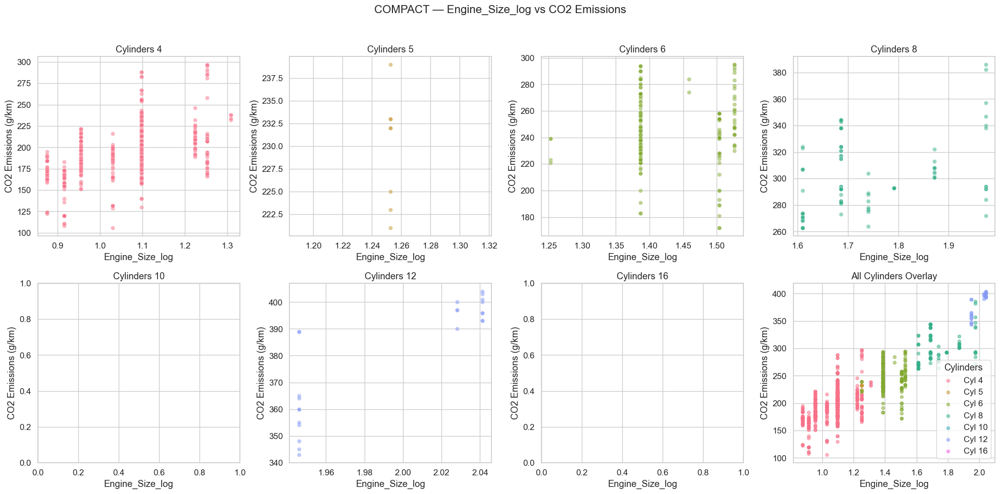

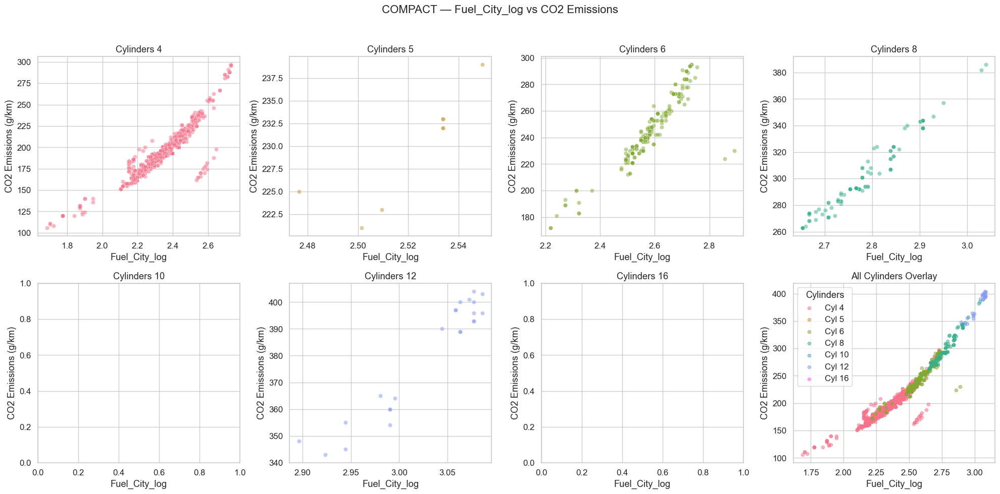

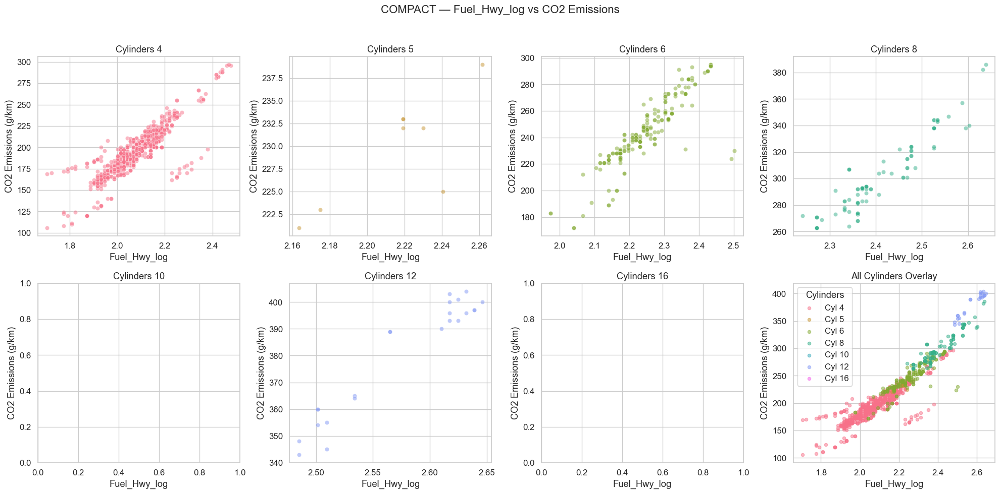

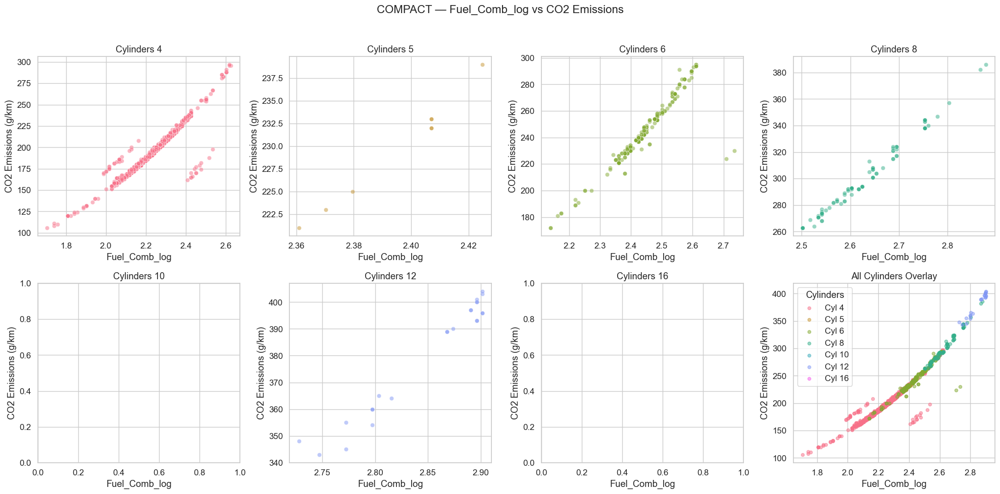

Generating plots for Vehicle Class: SUV - SMALL


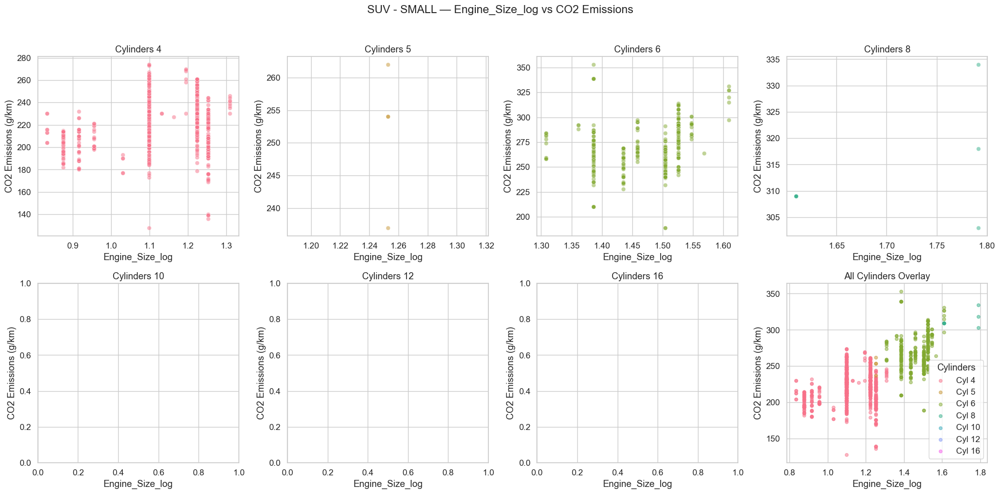

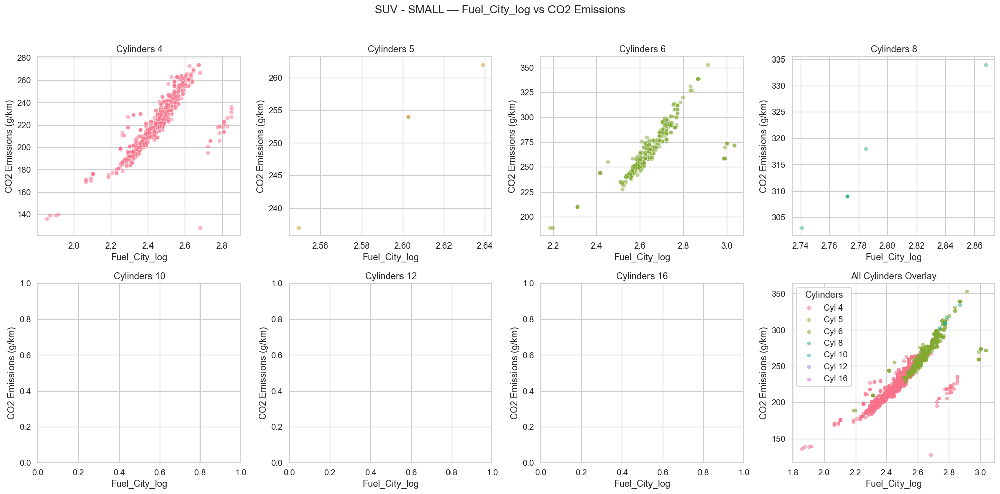

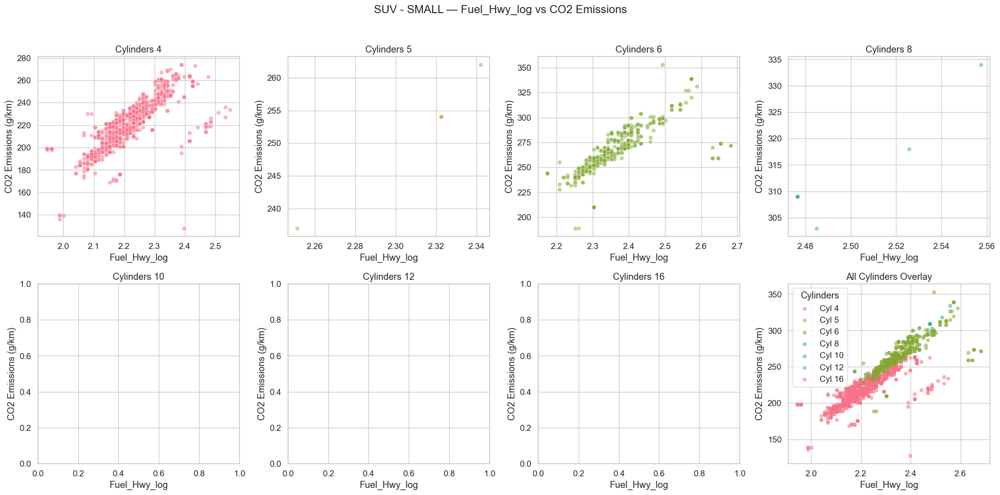

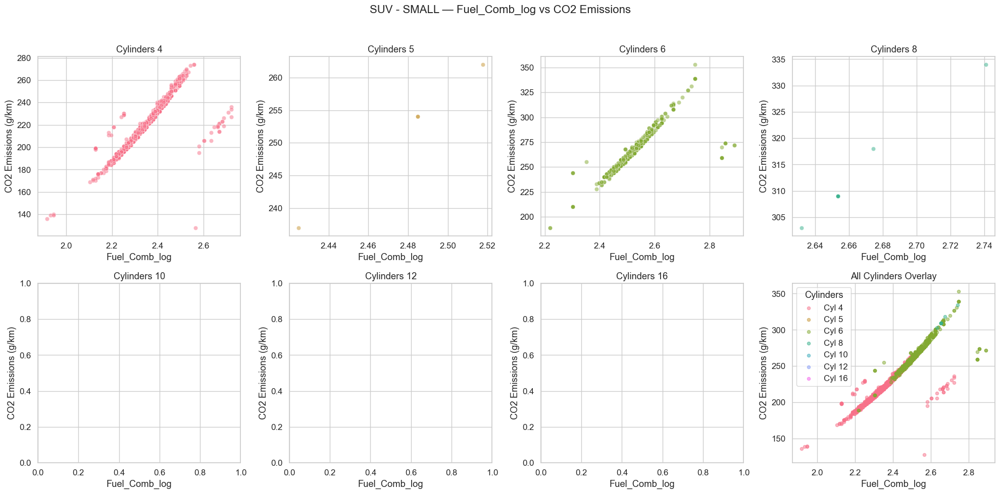

Generating plots for Vehicle Class: MID-SIZE


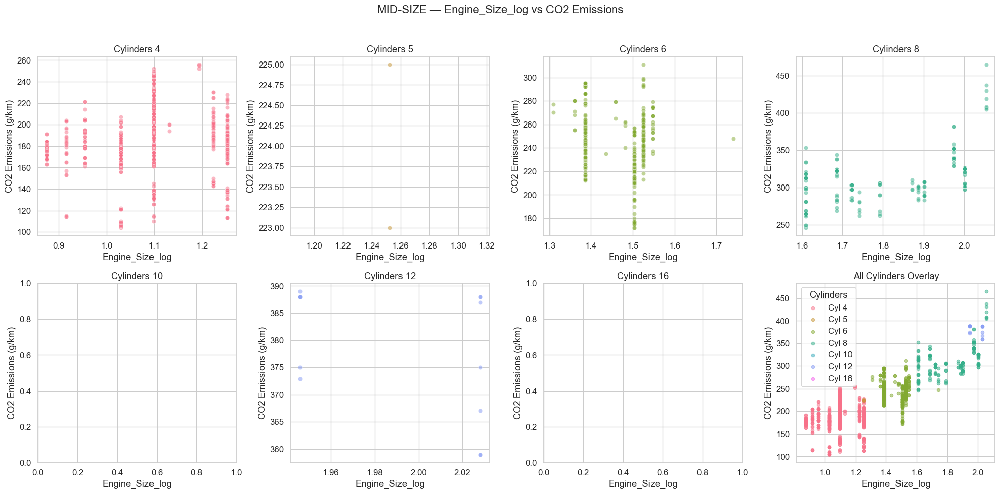

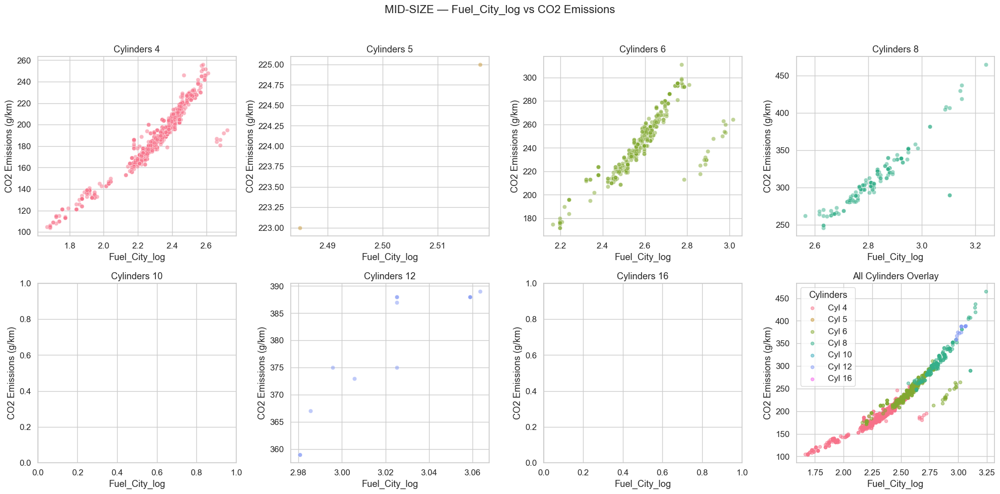

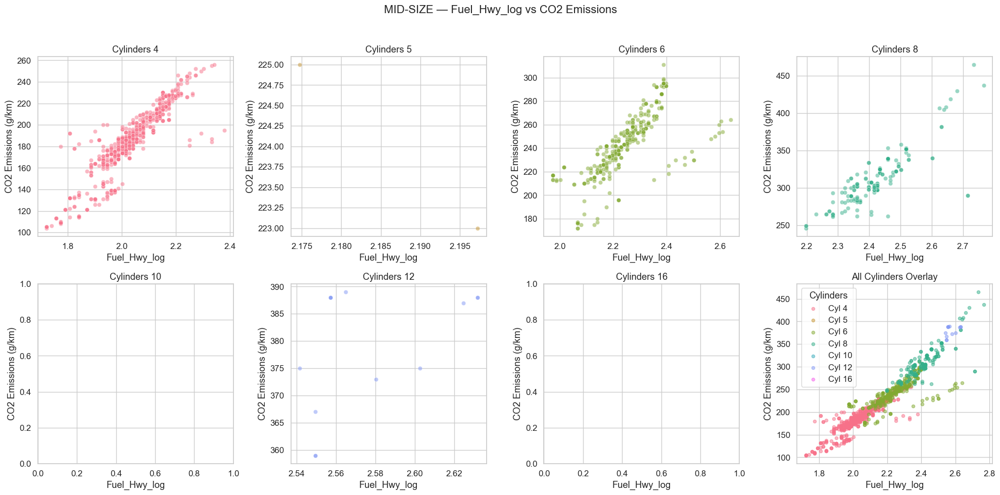

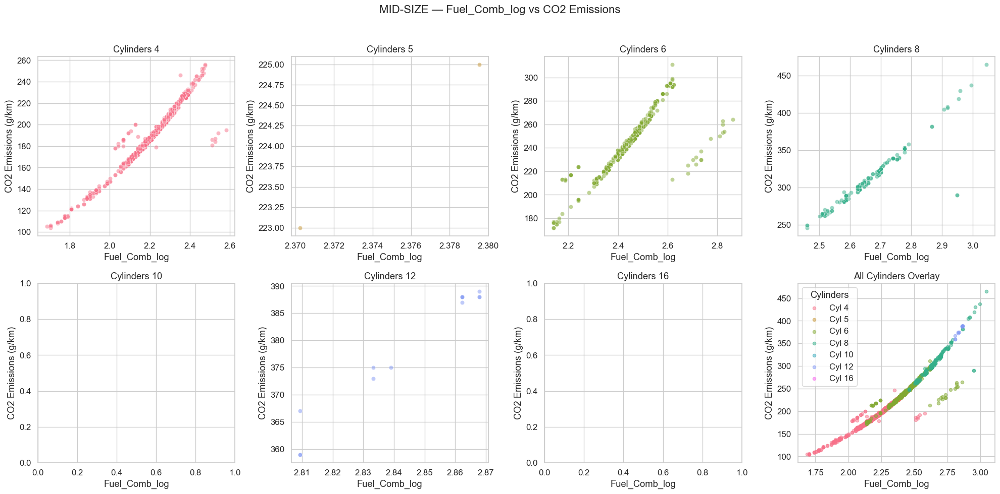

Generating plots for Vehicle Class: TWO-SEATER


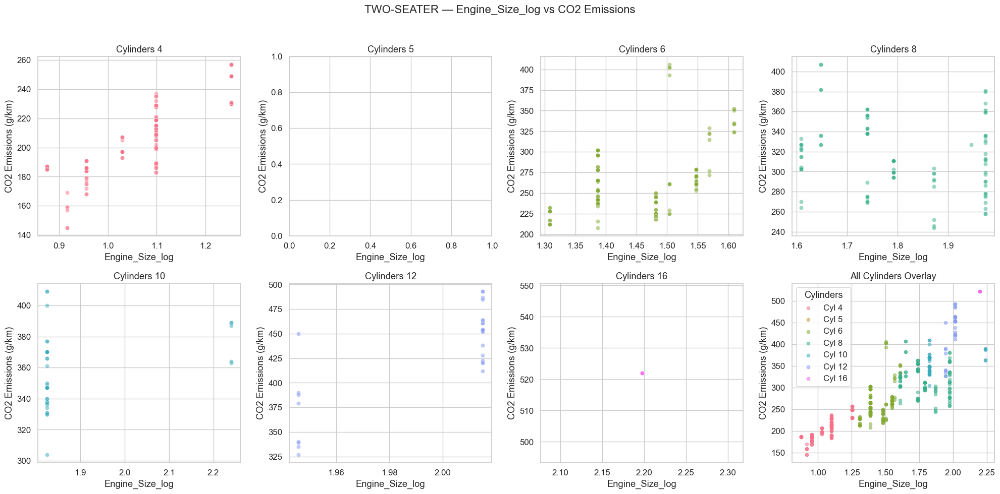

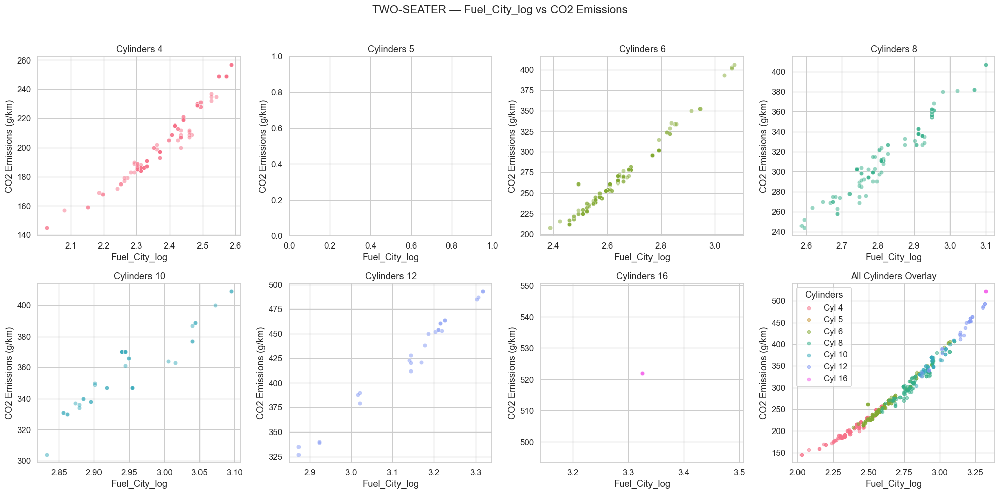

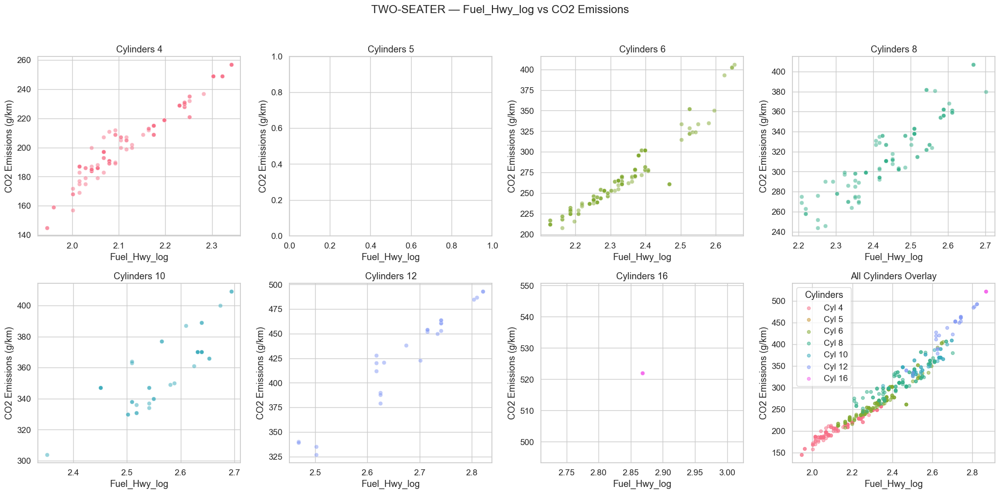

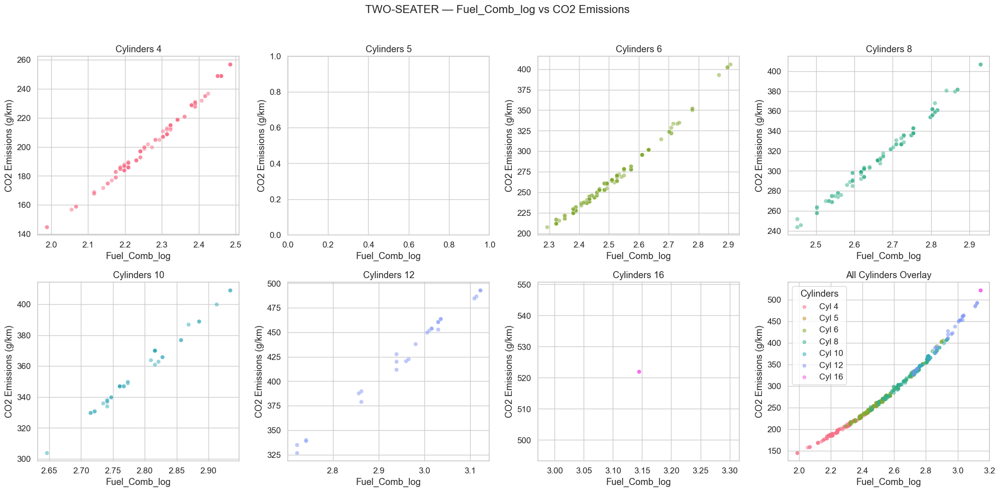

Generating plots for Vehicle Class: MINICOMPACT


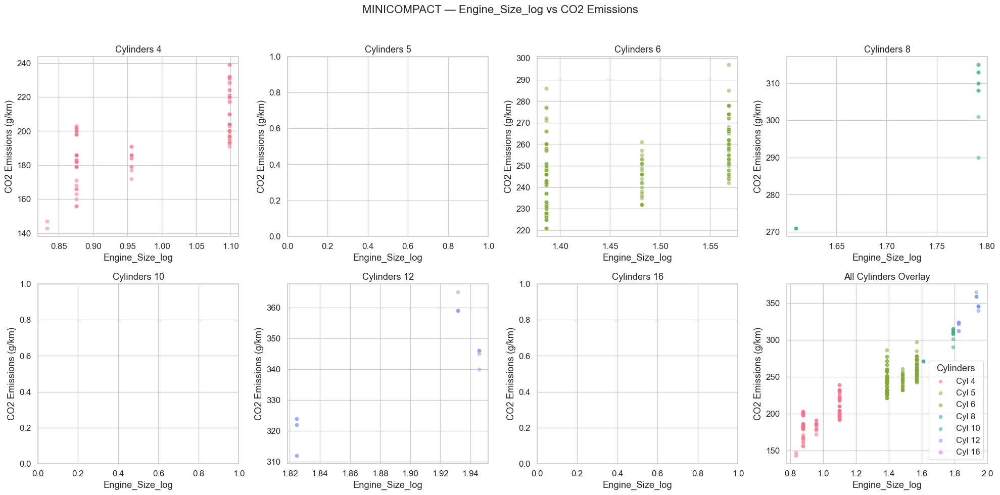

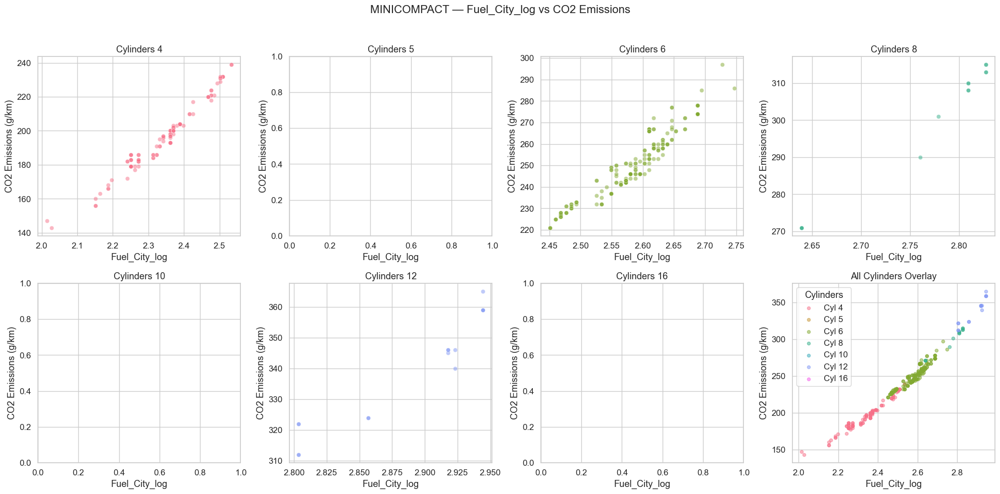

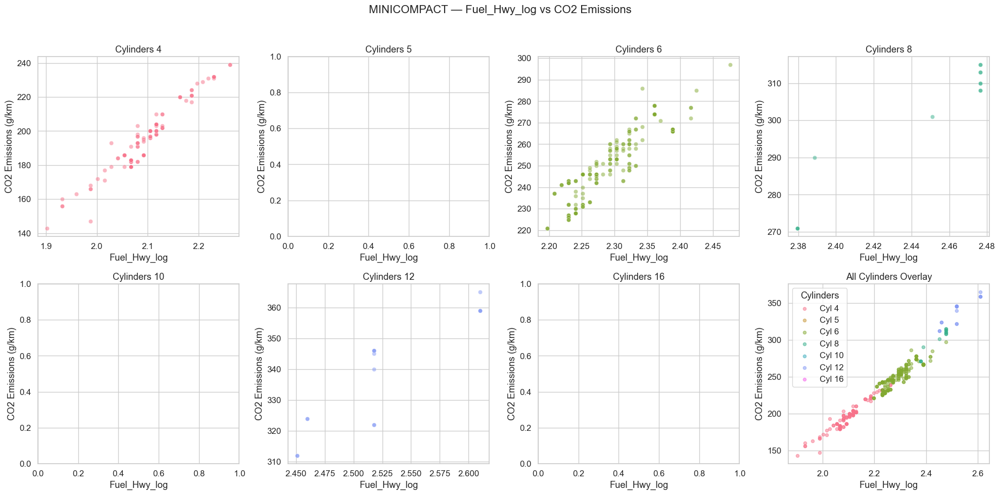

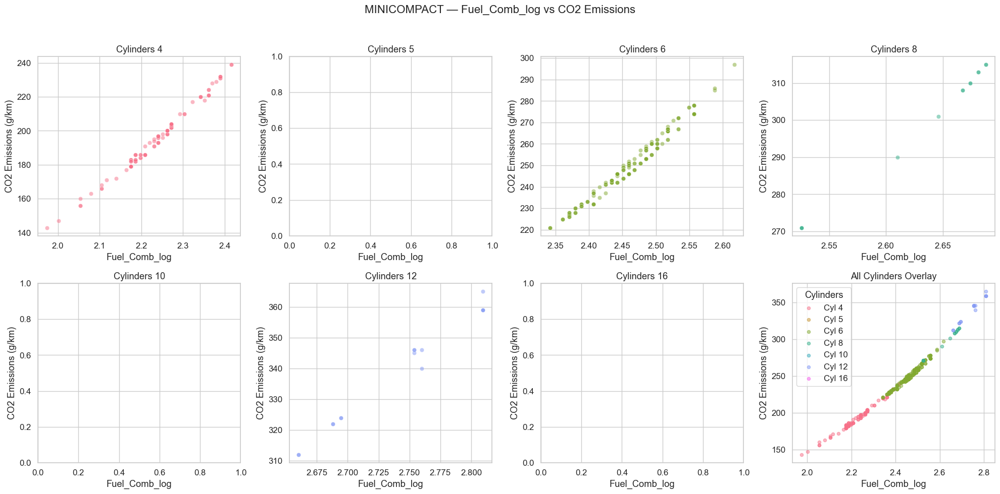

Generating plots for Vehicle Class: SUBCOMPACT


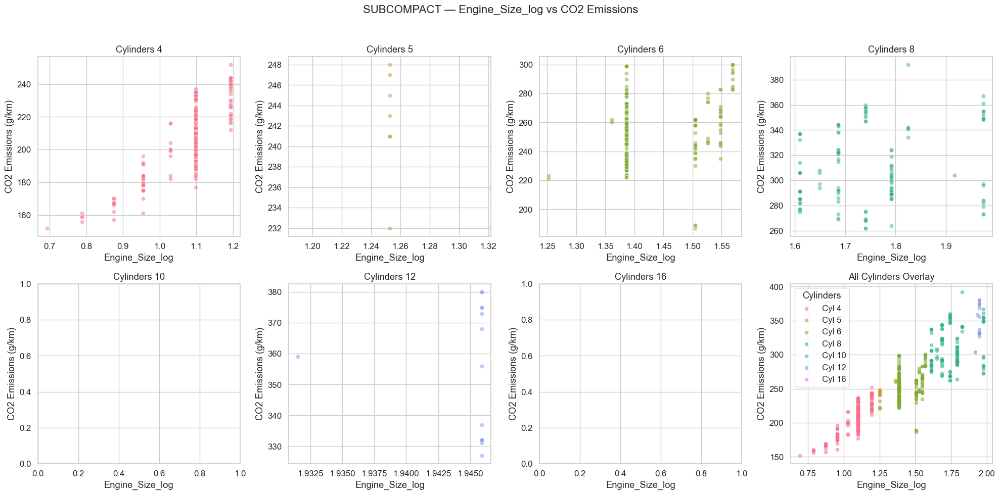

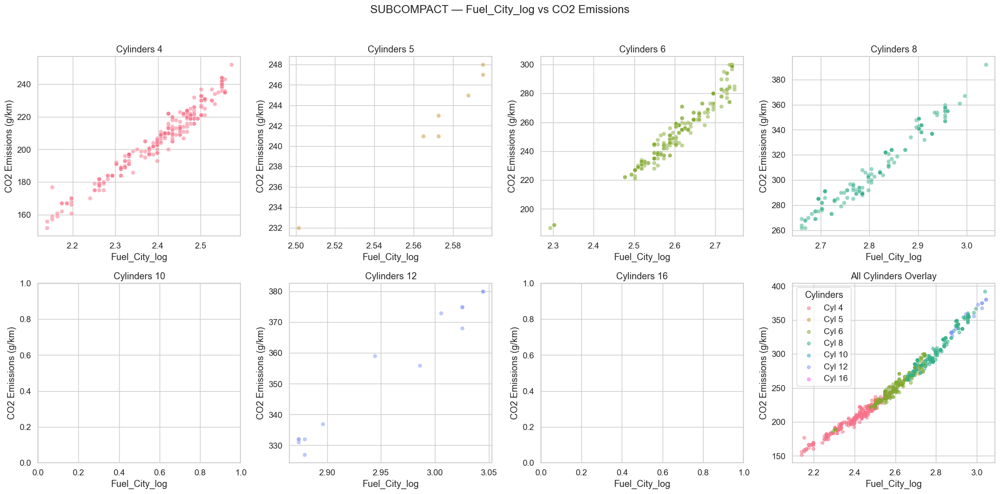

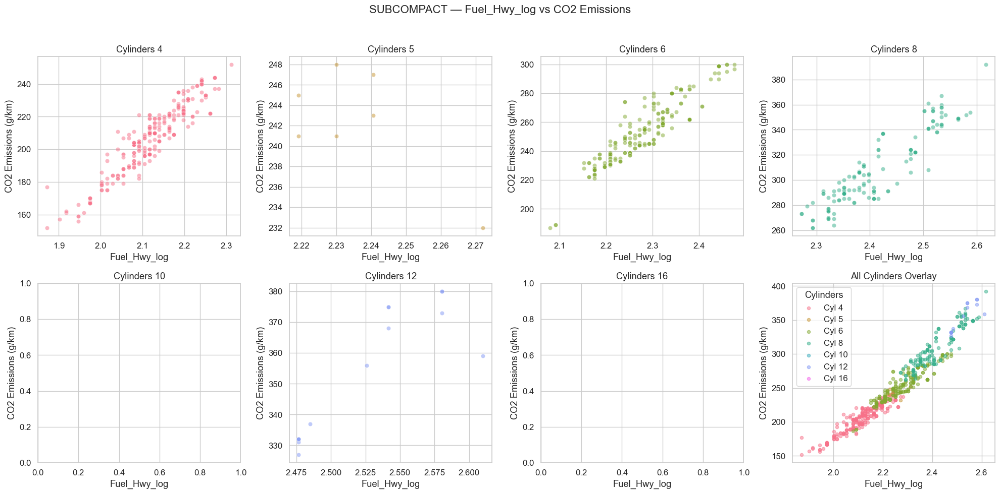

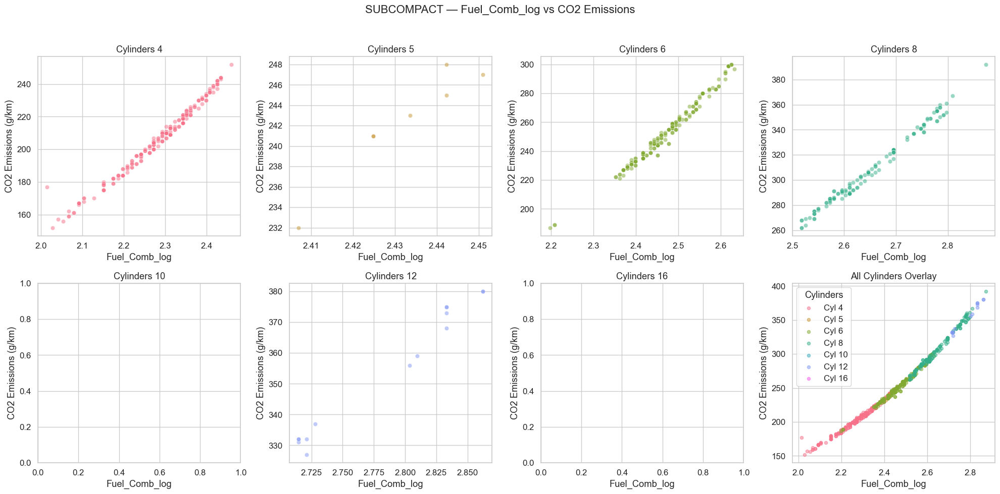

Generating plots for Vehicle Class: FULL-SIZE


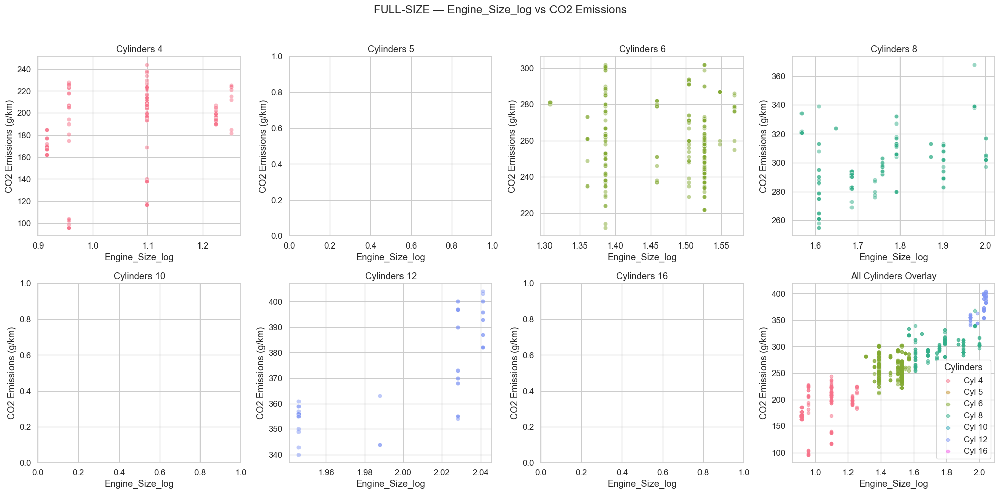

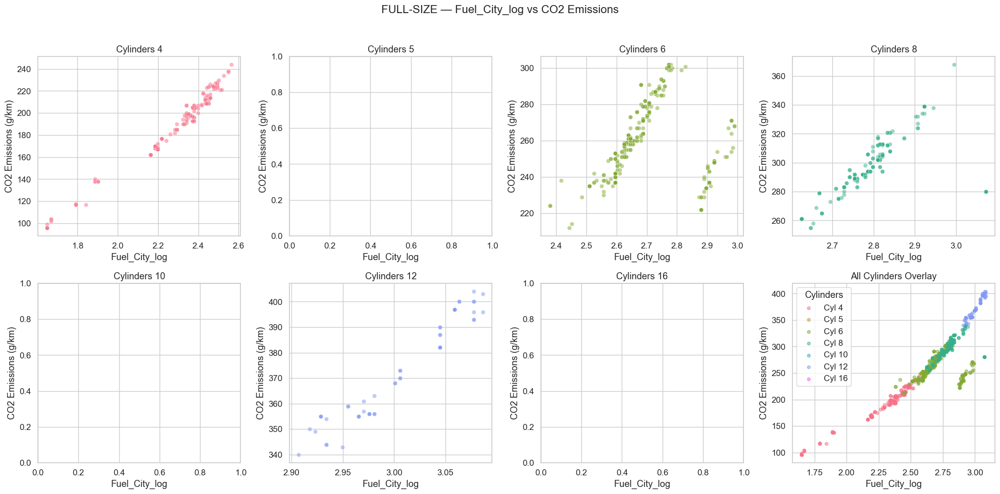

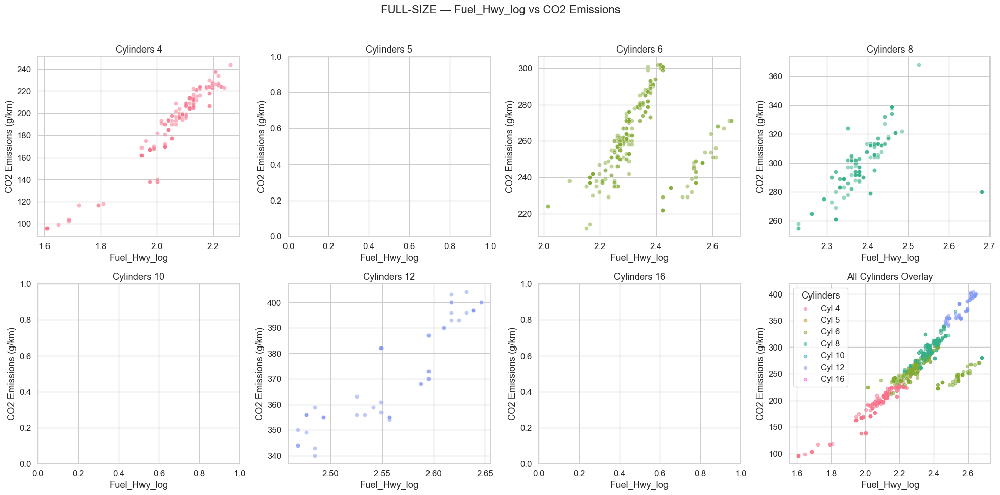

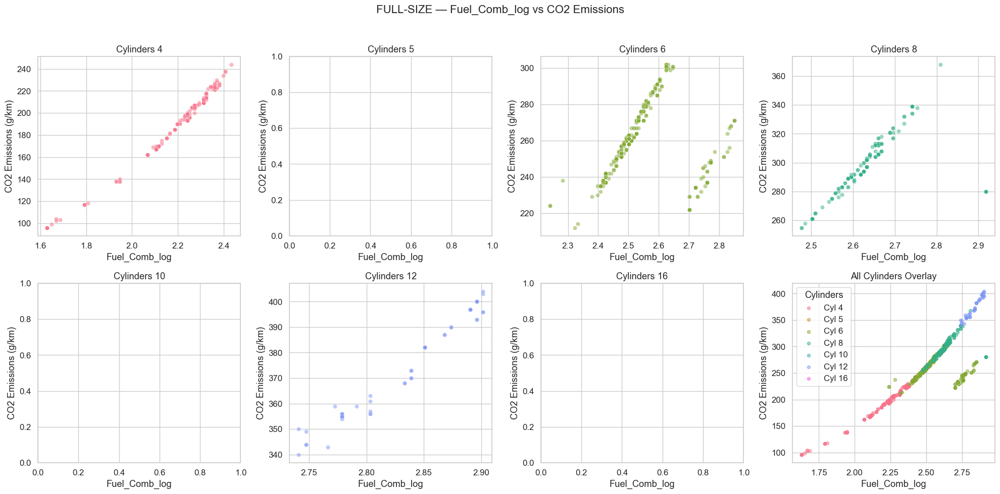

Generating plots for Vehicle Class: STATION WAGON - SMALL


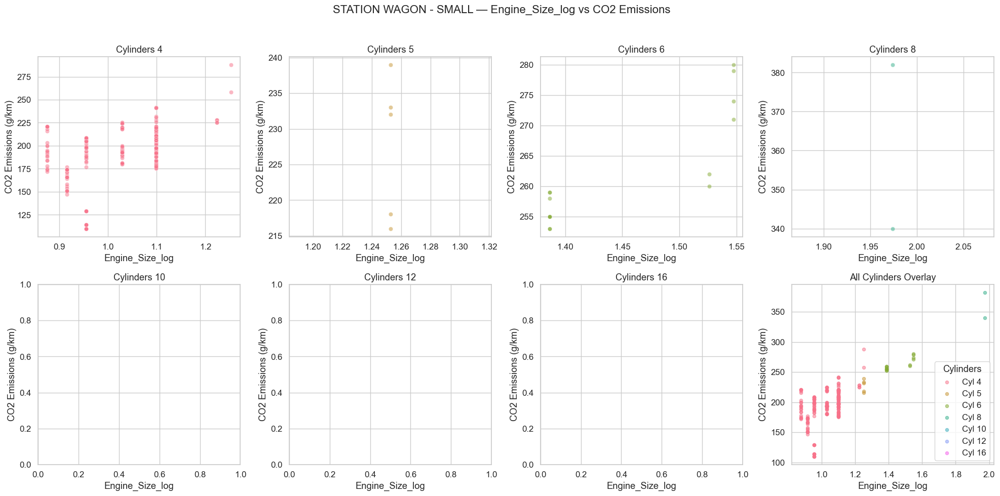

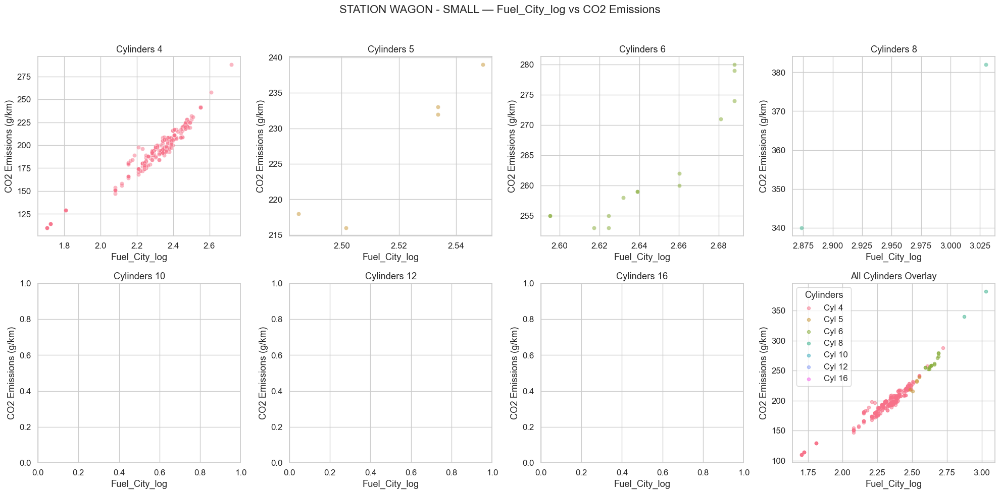

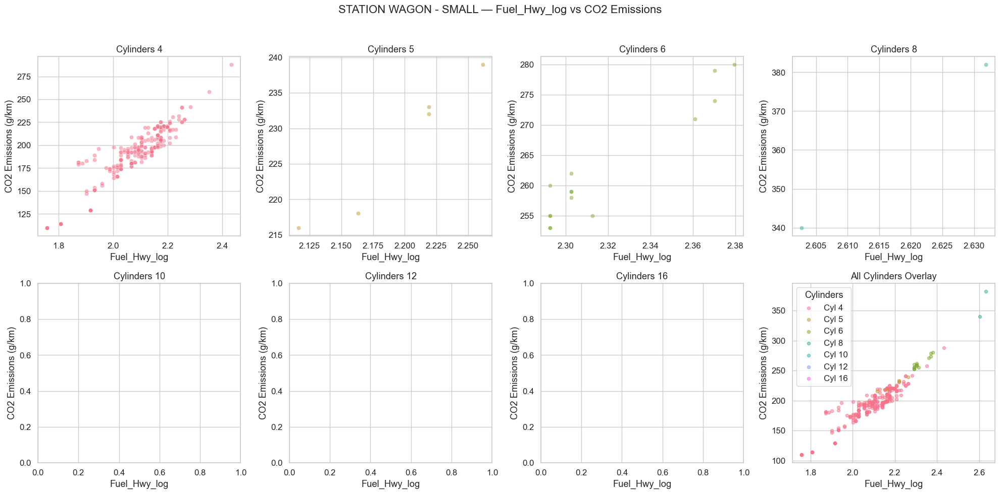

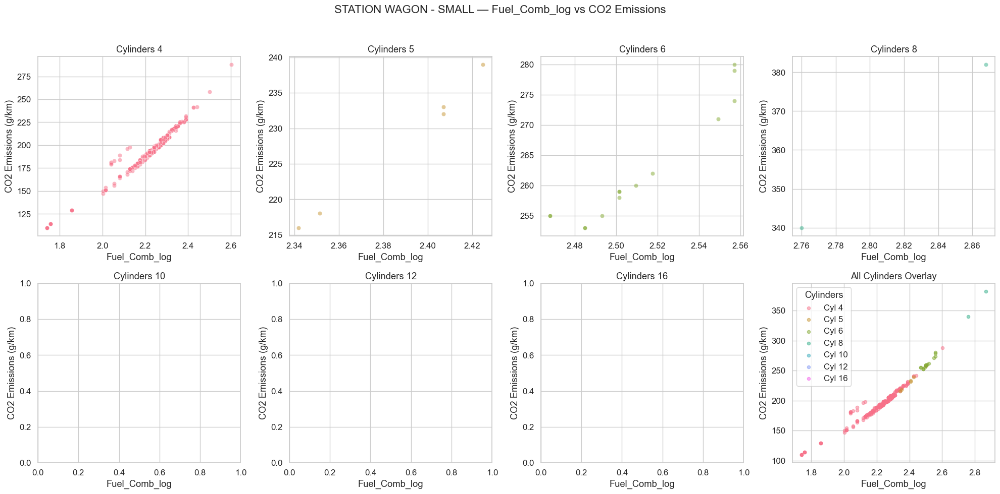

Generating plots for Vehicle Class: SUV - STANDARD


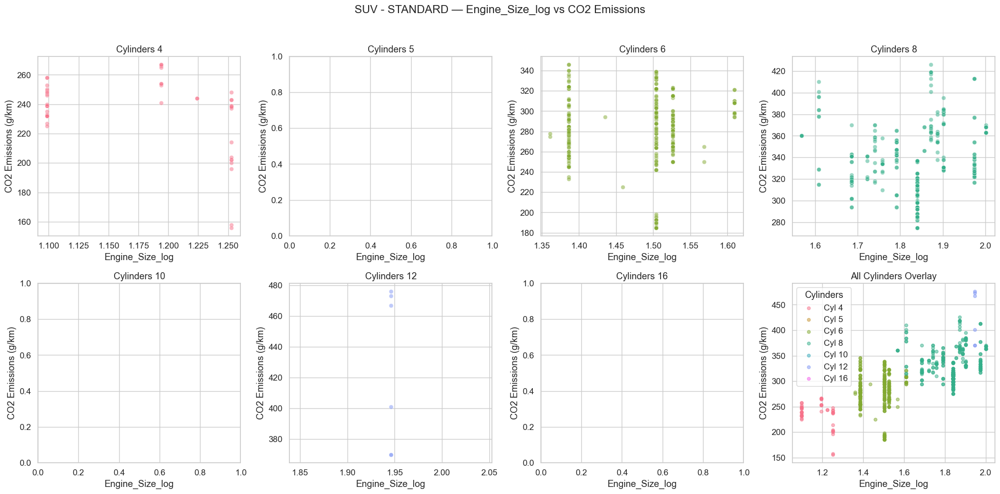

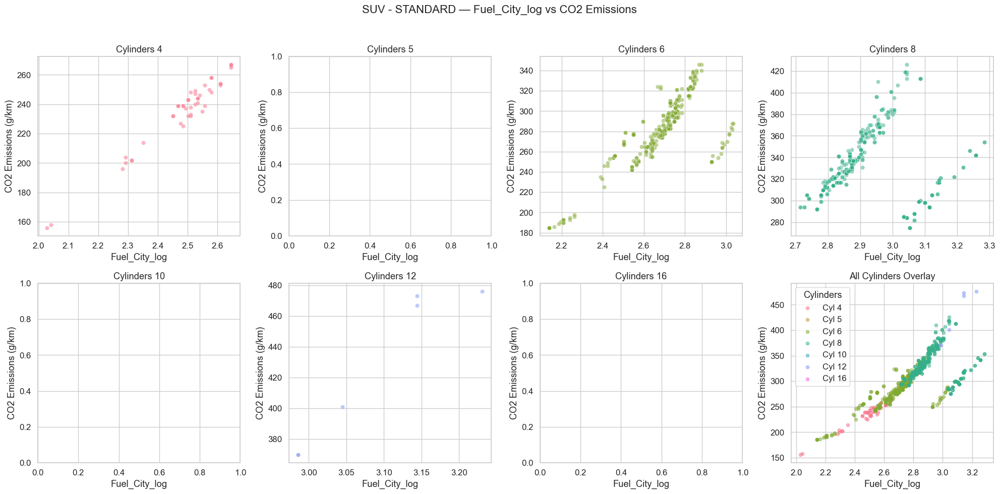

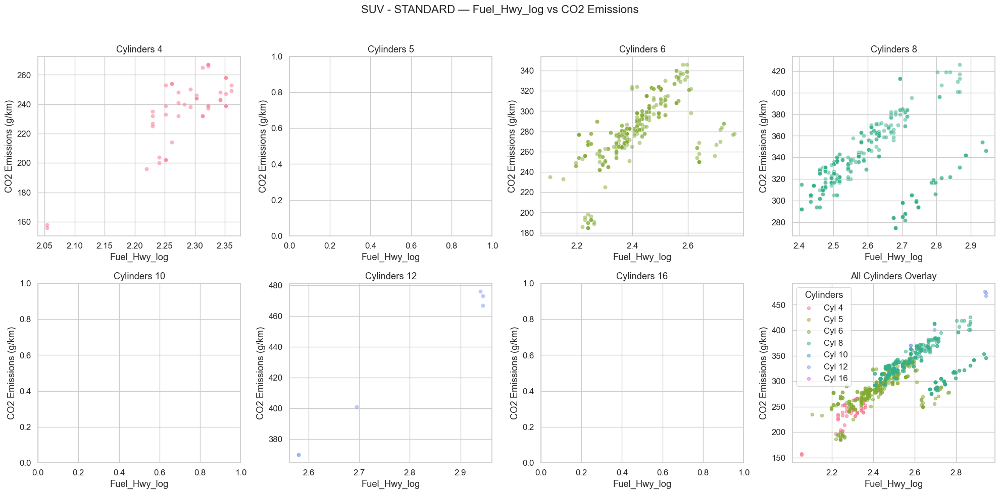

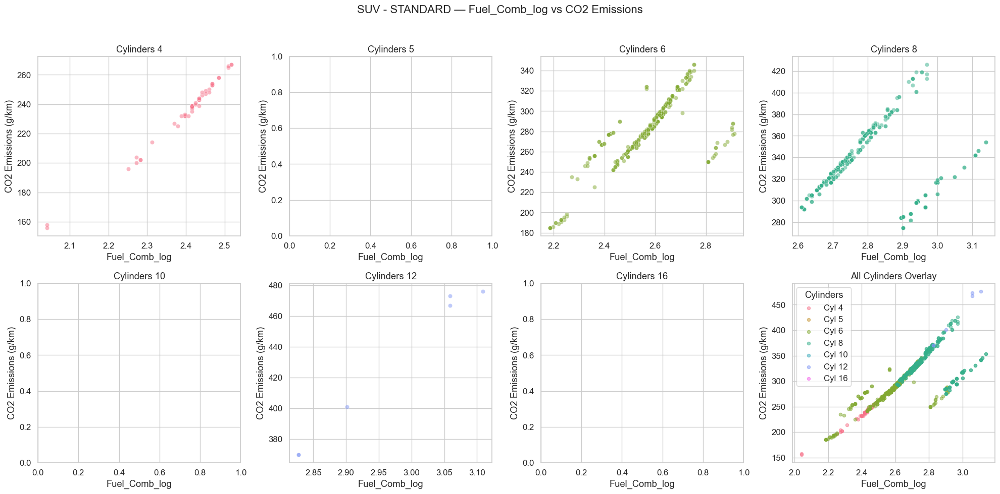

Generating plots for Vehicle Class: VAN - CARGO


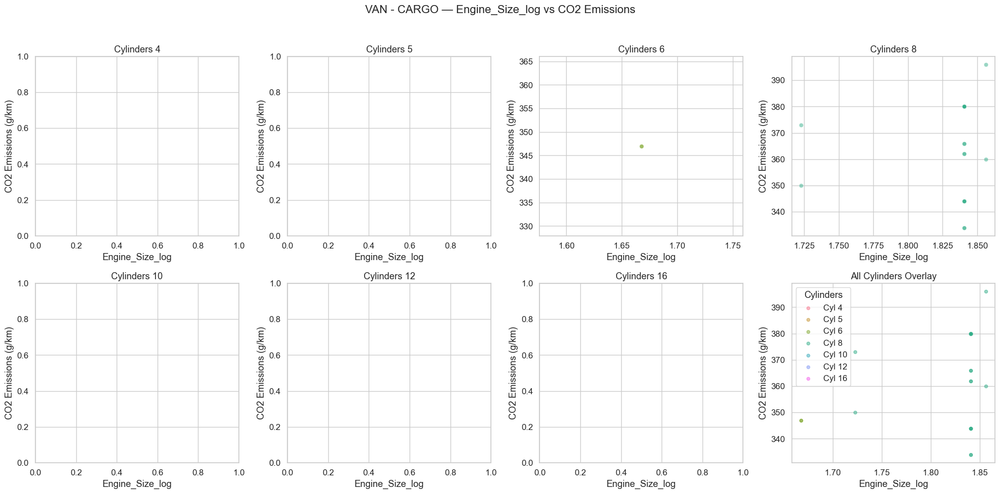

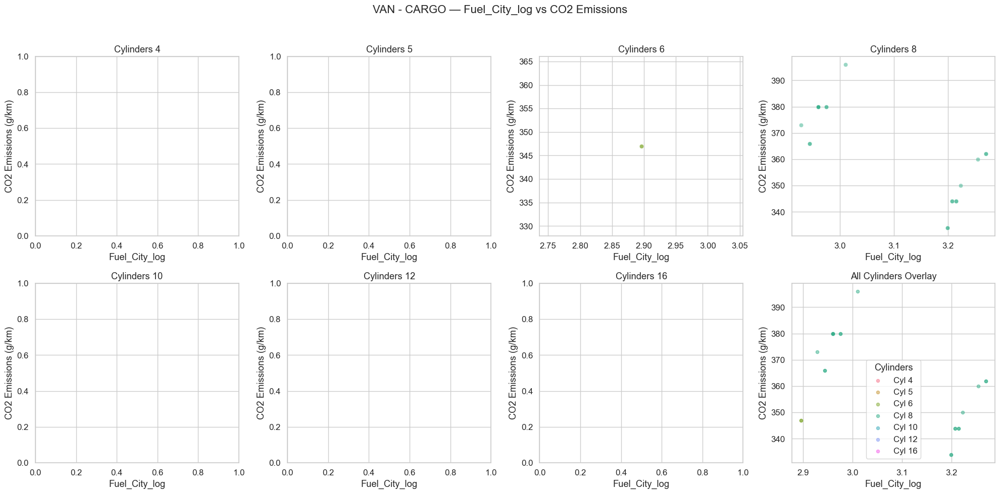

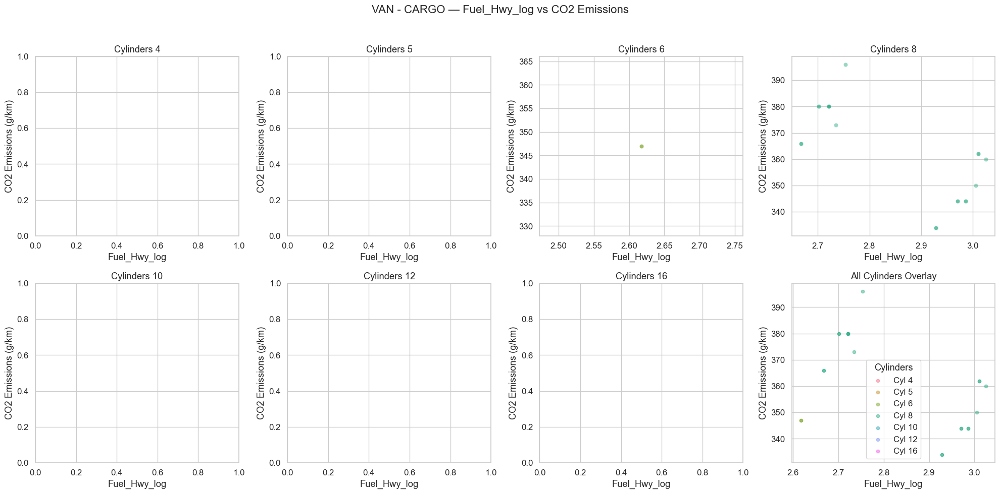

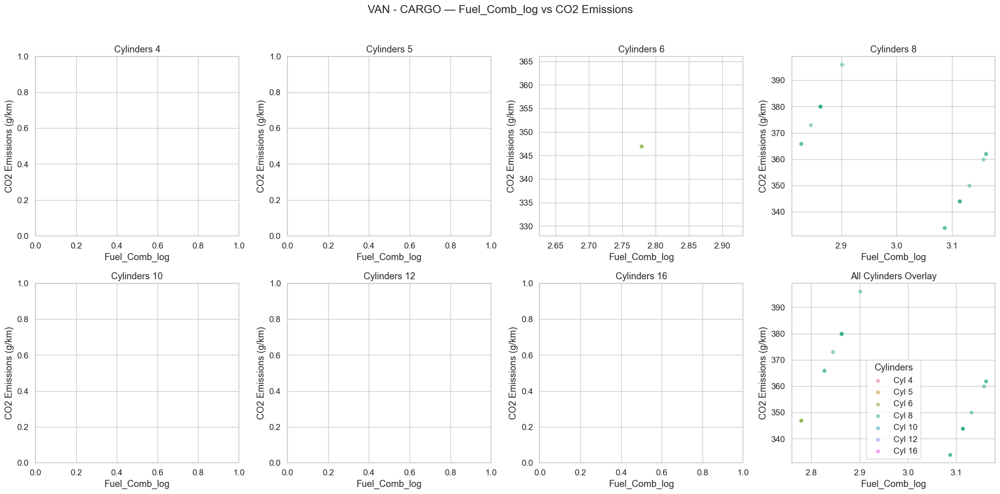

Generating plots for Vehicle Class: VAN - PASSENGER


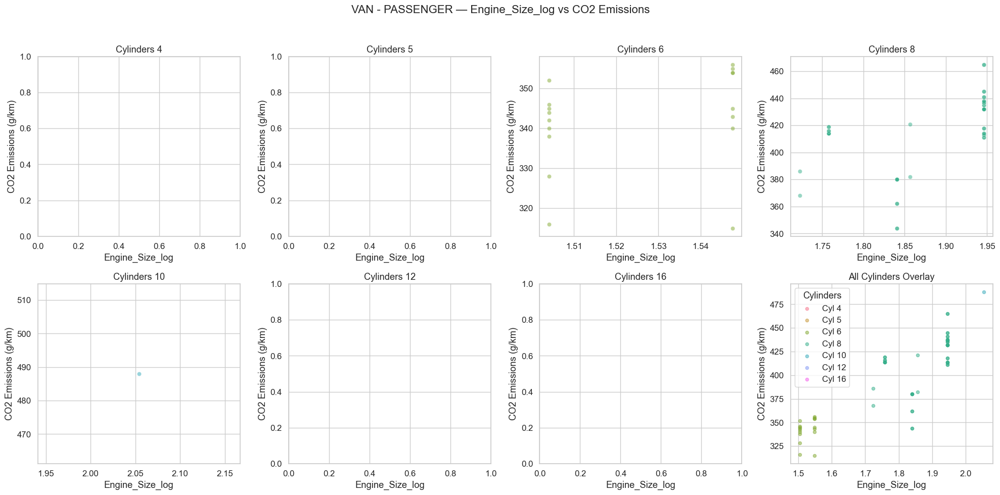

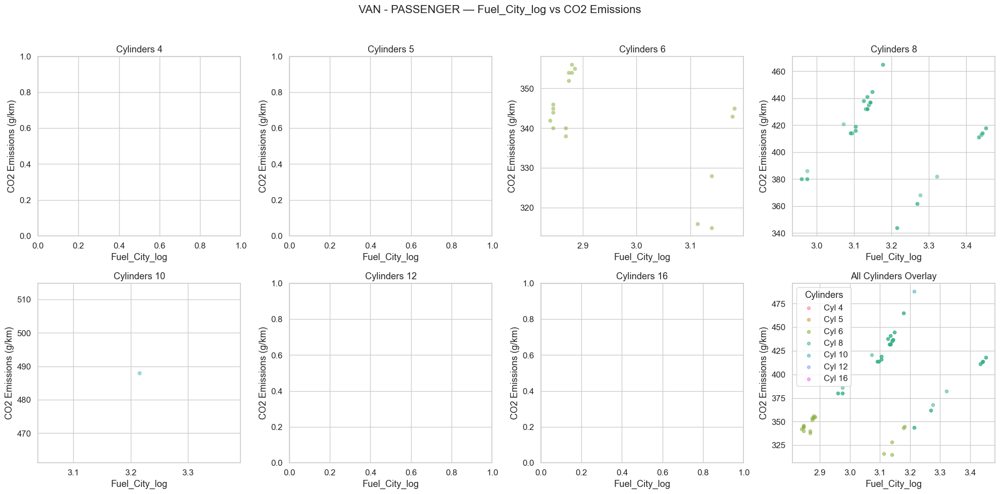

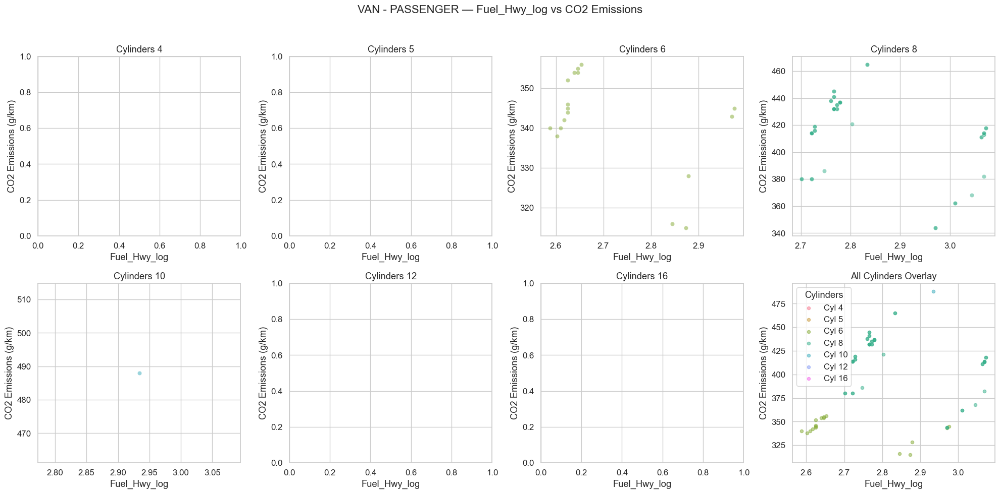

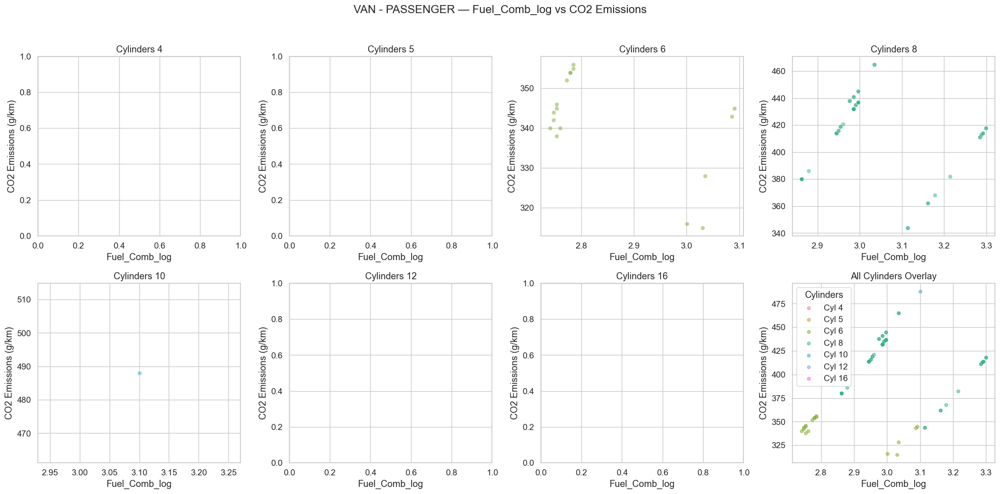

Generating plots for Vehicle Class: PICKUP TRUCK - STANDARD


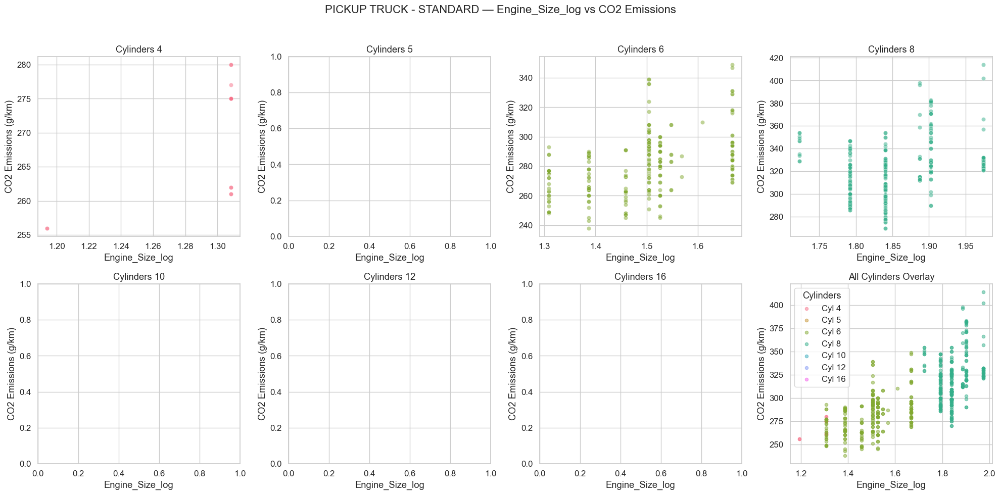

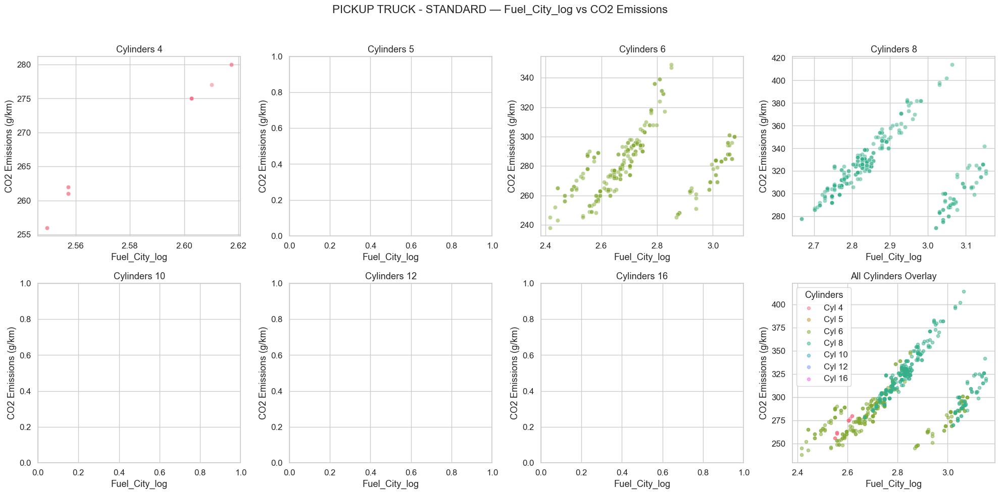

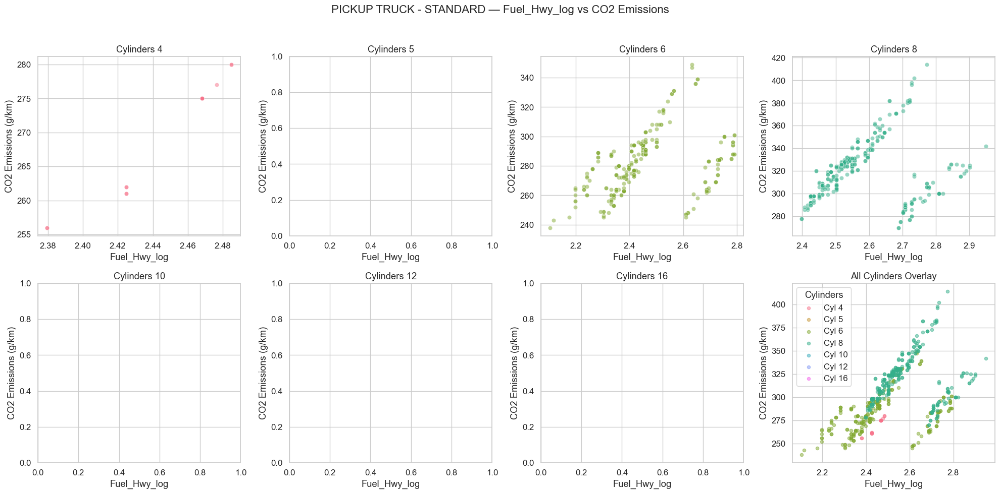

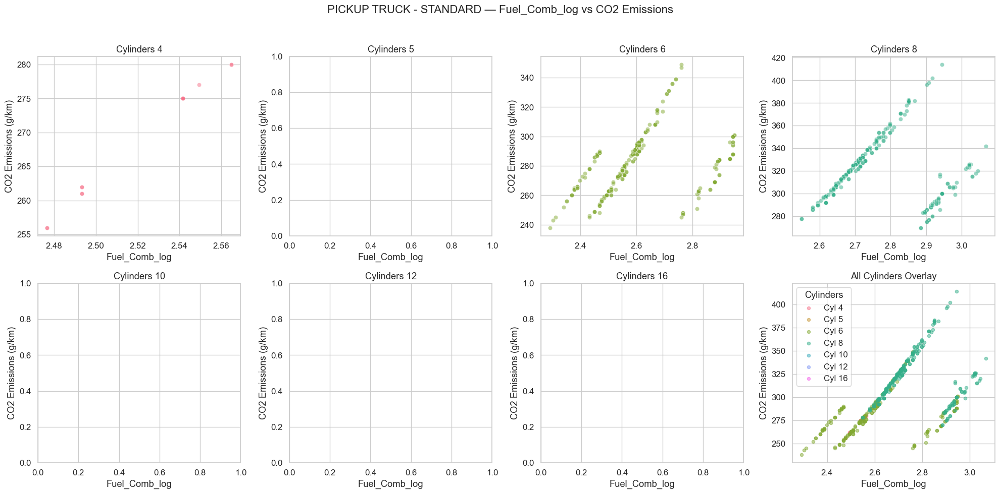

Generating plots for Vehicle Class: MINIVAN


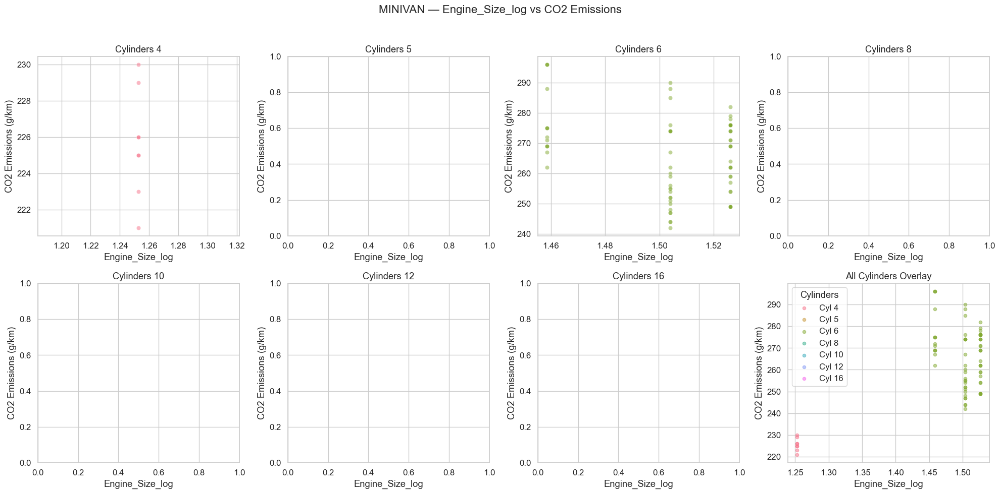

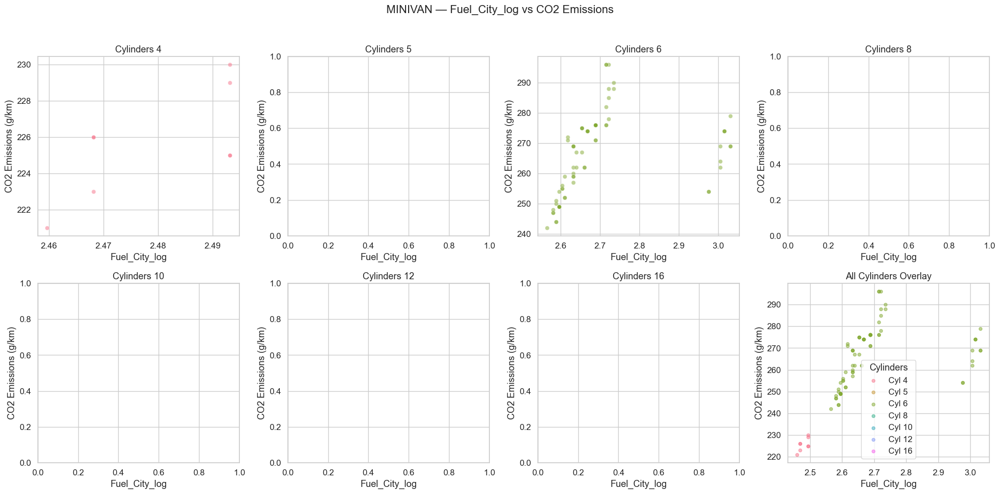

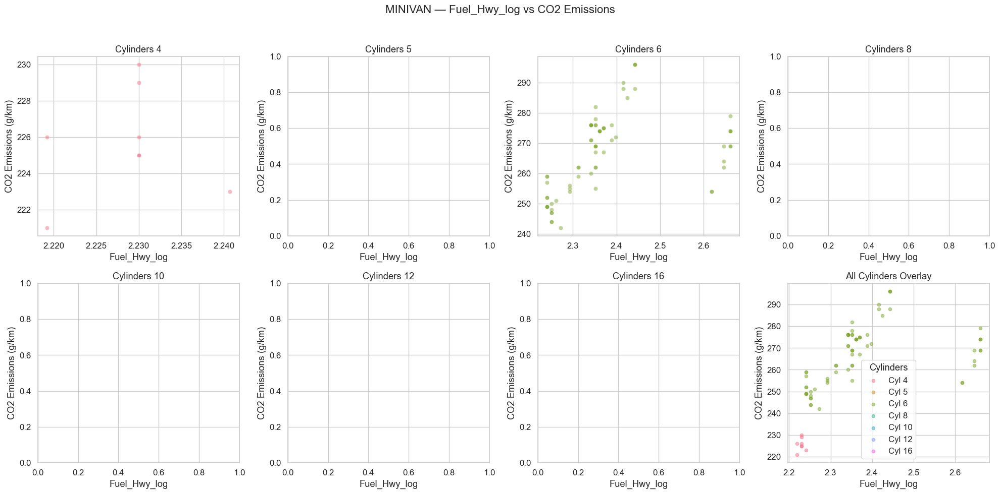

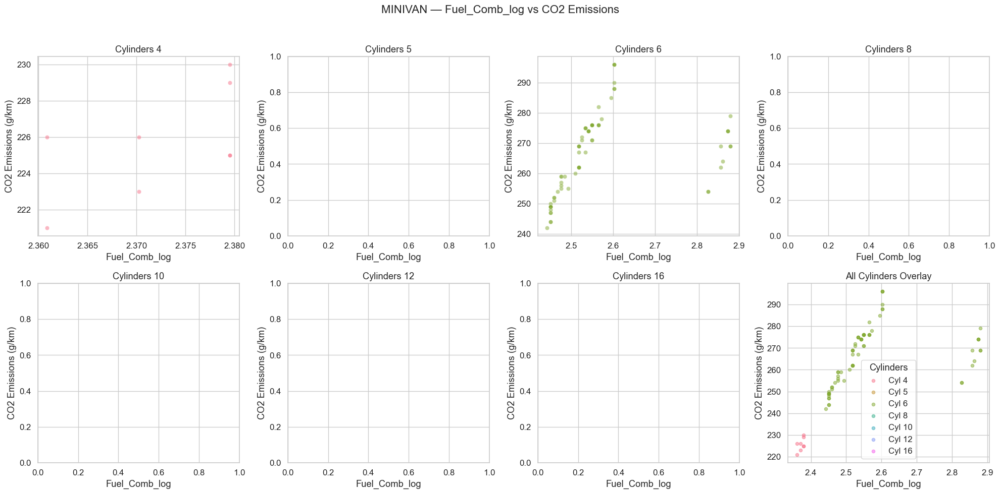

Generating plots for Vehicle Class: SPECIAL PURPOSE VEHICLE


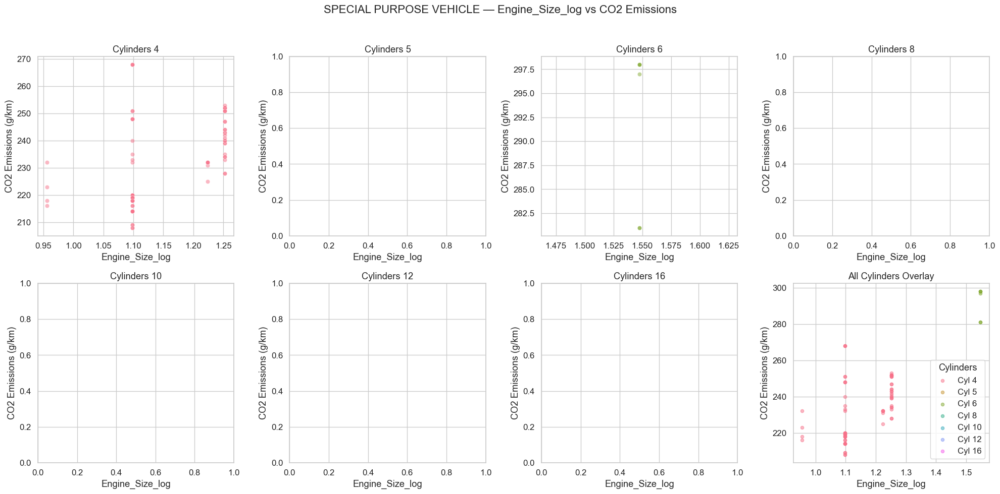

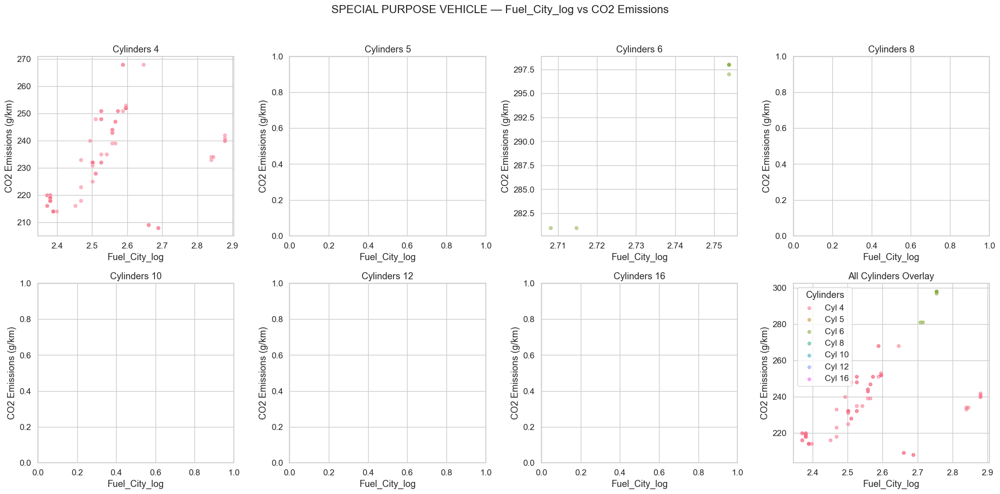

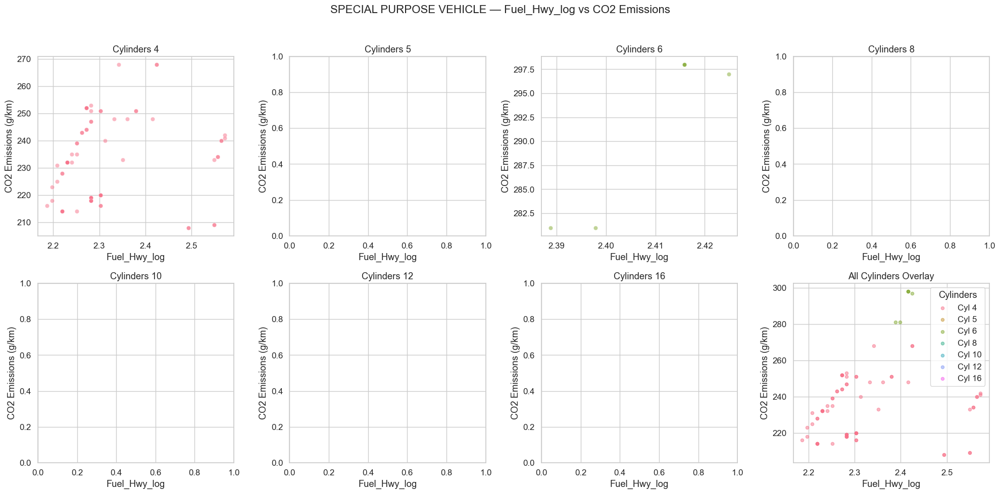

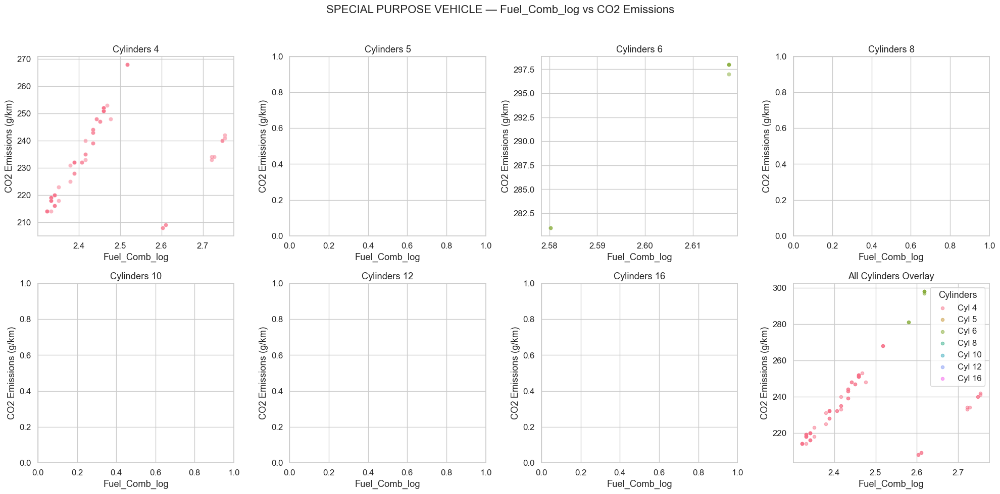

Generating plots for Vehicle Class: STATION WAGON - MID-SIZE


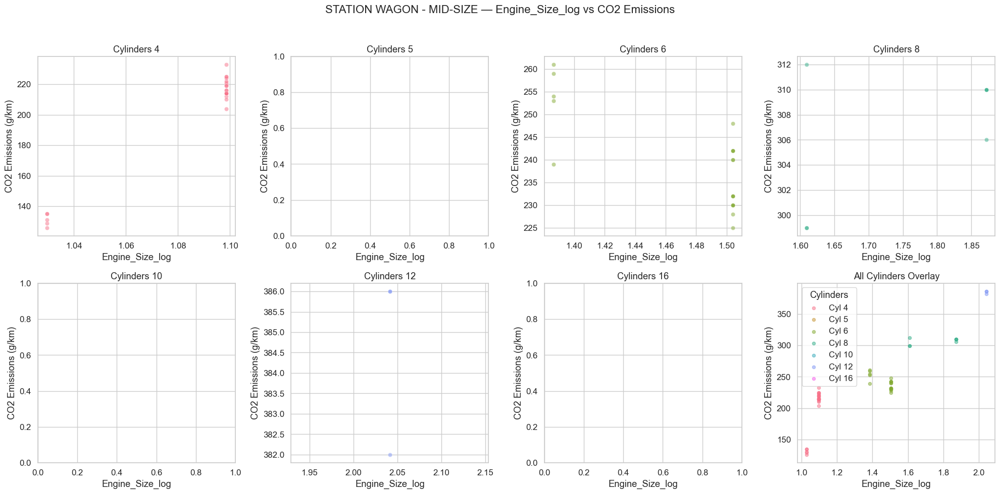

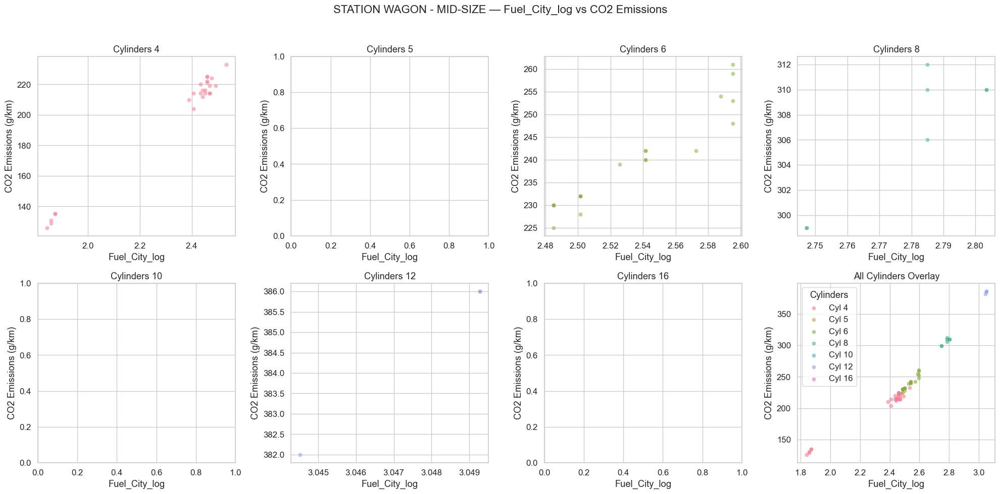

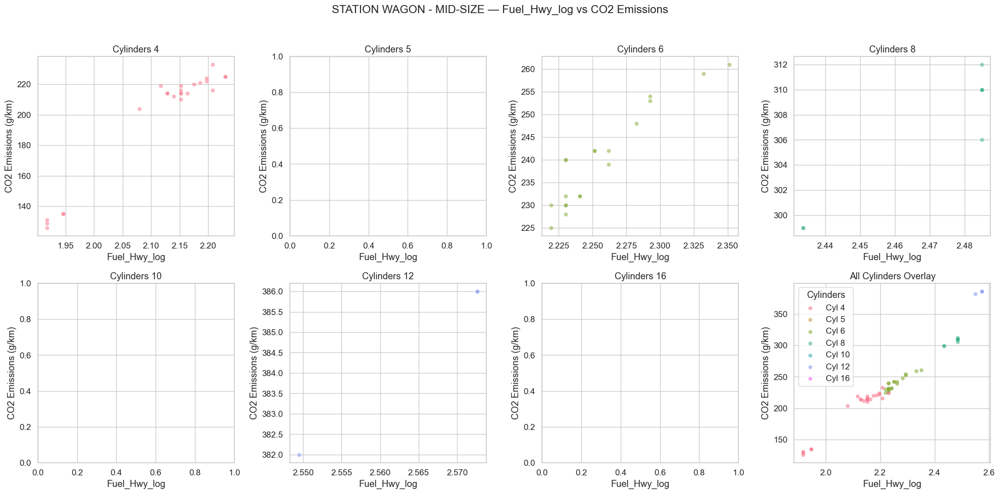

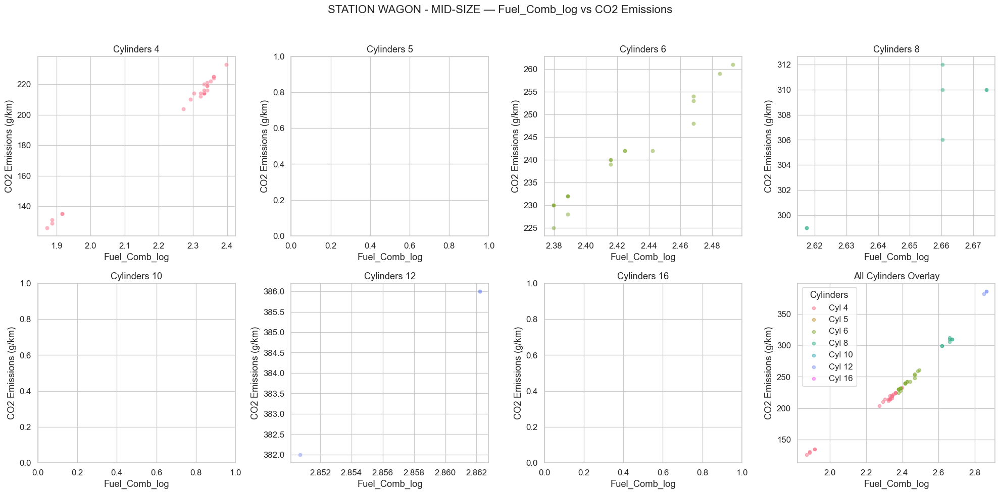

Generating plots for Vehicle Class: PICKUP TRUCK - SMALL


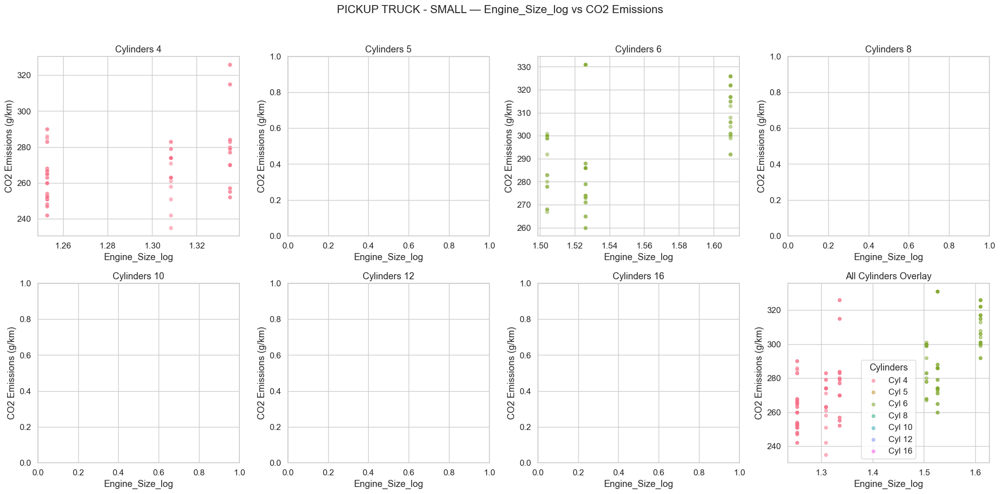

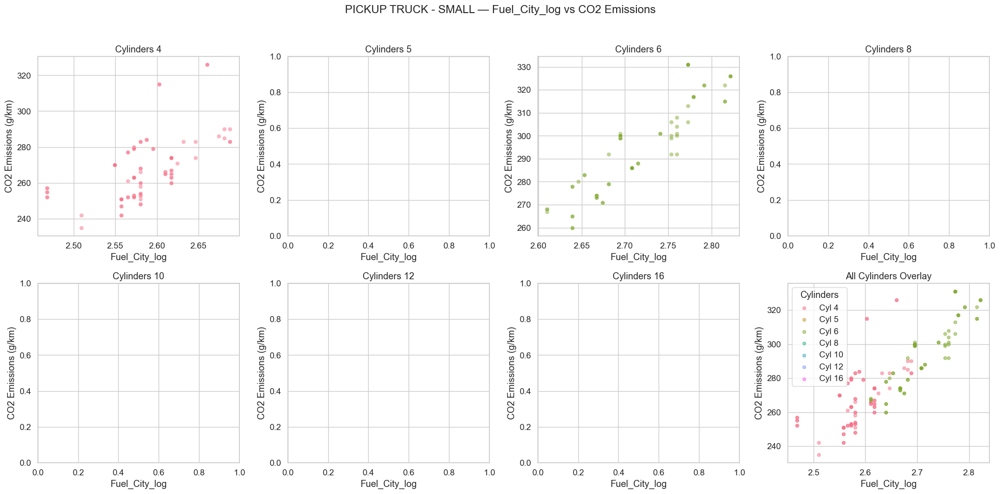

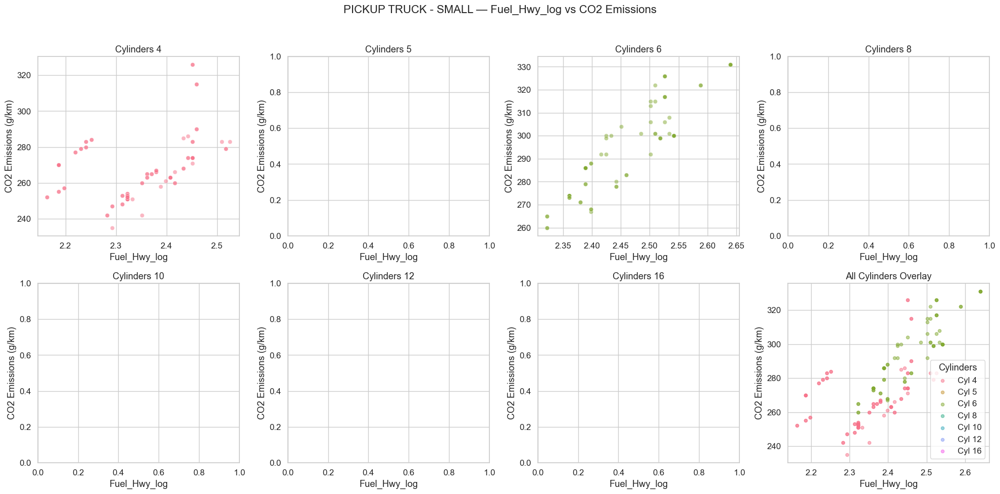

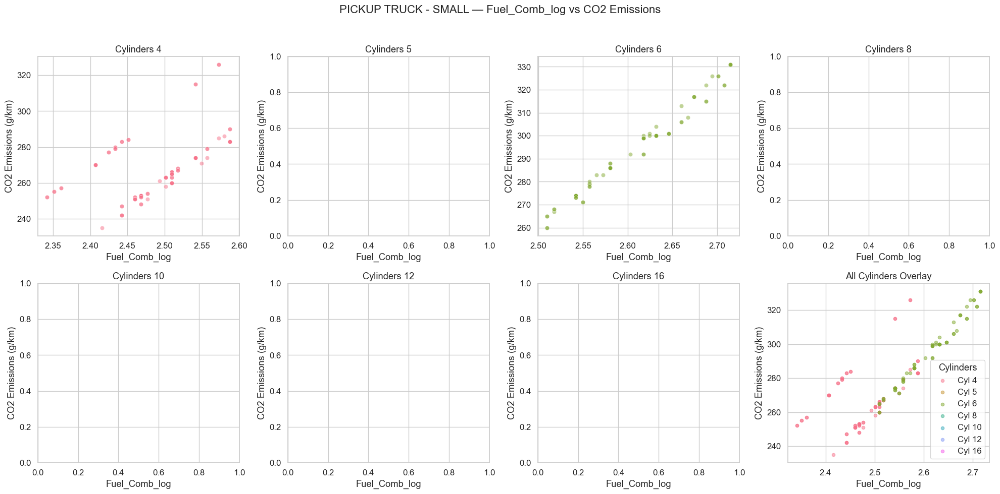

In [333]:
sns.set(style="whitegrid", font_scale=1.1)

# Define features and cylinder columns
features = ['Engine_Size_log','Fuel_City_log', 'Fuel_Hwy_log', 'Fuel_Comb_log']
cylinder_columns = ['Cylinders_4', 'Cylinders_5', 'Cylinders_6', 
                    'Cylinders_8', 'Cylinders_10', 'Cylinders_12', 'Cylinders_16']
cylinder_labels = {col: col.replace('Cylinders_', '') for col in cylinder_columns}
colors = sns.color_palette("husl", len(cylinder_columns))

# Loop through each Vehicle Class
for vehicle_class, df_class in vehicle_class_dfs.items():
    print(f"Generating plots for Vehicle Class: {vehicle_class}")
    
    # Skip if any required feature or column is missing
    if not all(f in df_class.columns for f in features + cylinder_columns + ['CO2 Emissions(g/km)']):
        print(f"Skipping {vehicle_class} due to missing columns.")
        continue
    
    for feature in features:
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
        axes = axes.flatten()

        # 1. Individual scatter plots per cylinder
        for i, col in enumerate(cylinder_columns):
            subset = df_class[df_class[col] == 1]
            sns.scatterplot(
                data=subset,
                x=feature,
                y='CO2 Emissions(g/km)',
                alpha=0.5,
                ax=axes[i],
                color=colors[i]
            )
            axes[i].set_title(f'Cylinders {cylinder_labels[col]}')
            axes[i].set_xlabel(feature)
            axes[i].set_ylabel('CO2 Emissions (g/km)')

        # 2. Combined overlay plot
        ax_combined = axes[-1]
        for i, col in enumerate(cylinder_columns):
            subset = df_class[df_class[col] == 1]
            ax_combined.scatter(
                subset[feature],
                subset['CO2 Emissions(g/km)'],
                label=f'Cyl {cylinder_labels[col]}',
                alpha=0.5,
                s=20,
                color=colors[i]
            )
        ax_combined.set_title('All Cylinders Overlay')
        ax_combined.set_xlabel(feature)
        ax_combined.set_ylabel('CO2 Emissions (g/km)')
        ax_combined.legend(title="Cylinders")

        fig.suptitle(f'{vehicle_class} — {feature} vs CO2 Emissions', fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

### **❌ Why Modeling by Vehicle Class Doesn’t Work**
During exploratory visualization, we examined how CO2 emissions relate to fuel consumption features (e.g., Fuel_Comb_log, Fuel_City_log) across different Vehicle Classes, grouped by cylinder count.

While this seemed like a logical approach initially, the resulting plots revealed a fundamental issue:

🔍 Observation:
Even when splitting the data by Vehicle Class, the scatter plots still showed:

Multiple distinct bands (groupings) in the same plot.

Non-linear relationships between fuel consumption and CO2 emissions.

In many cases, 3–4 parallel clusters appeared — each band corresponding to a different underlying engine or fuel system type.

This behavior suggests that Vehicle Class alone cannot explain the variance in emissions. Instead of cleaning the trend, it leaves the data fragmented. A linear regression model trained on such a dataset:

Cannot generalize well across the bands.

Is forced to fit a line through what are effectively multiple different relationships.

Produces poor predictions, especially in regions where bands diverge.

❗ Conclusion:
Using Vehicle Class as a splitting criterion is not viable for modeling CO2 emissions. It introduces structural noise and banding that a linear or even polynomial model cannot resolve meaningfully.

We need a more fundamental variable — one that truly drives emission behavior — which led us to analyze Fuel Type instead. There, the relationships were far more coherent and continuous, making it the proper axis along which to segment the modeling process.



In [337]:
df2_clean = df1.drop(columns=['Model', 'Make', 'Transmission','Vehicle Class'])

# ----- STEP 1: Get unique fuel types -----
fuel_types = df2_clean['Fuel Type'].unique()

# ----- STEP 2: Create dictionary of DataFrames per Fuel Type -----
fuel_type_dfs = {
    ftype: df2_clean[df2_clean['Fuel Type'] == ftype].copy()
    for ftype in fuel_types
}

# ----- STEP 3: Confirm it worked -----
print("Prepared DataFrames for Fuel Types:")
print(fuel_type_dfs.keys())


Prepared DataFrames for Fuel Types:
dict_keys(['Z', 'D', 'X', 'E', 'N'])


Generating plots for Fuel Type: Z


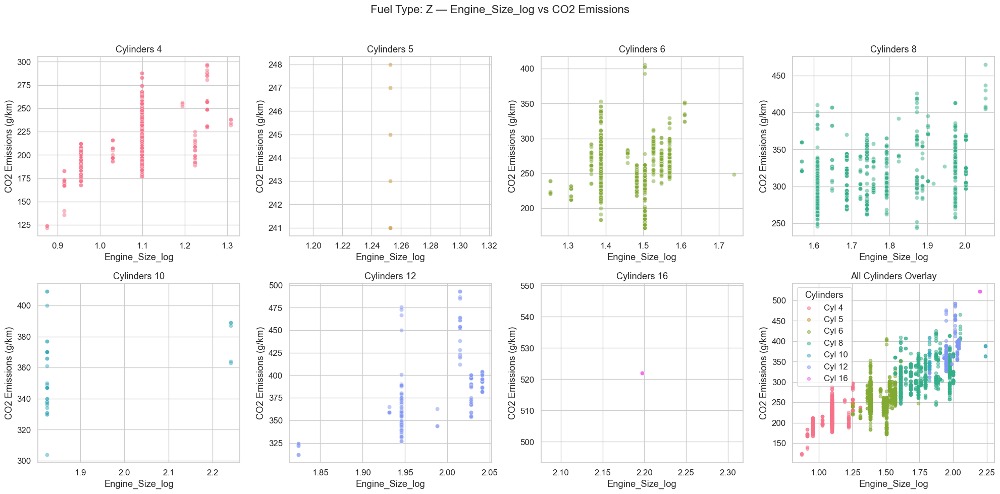

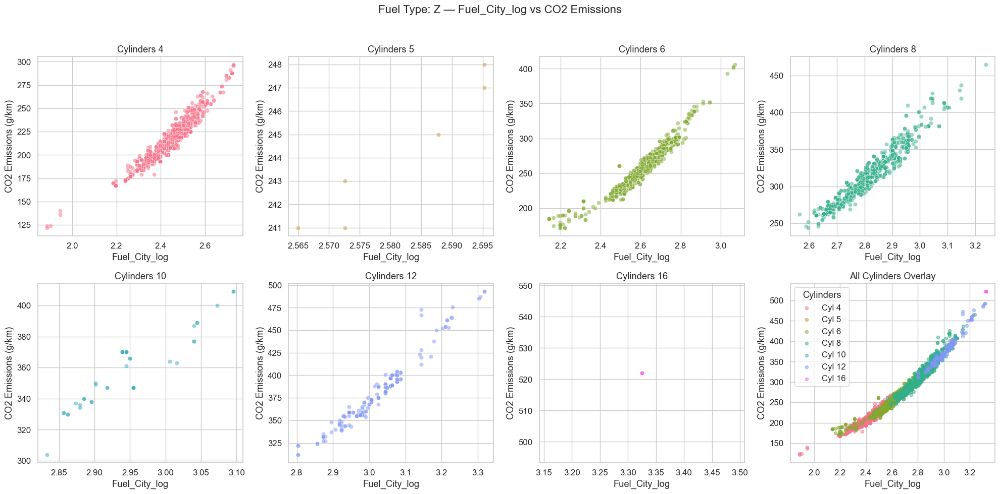

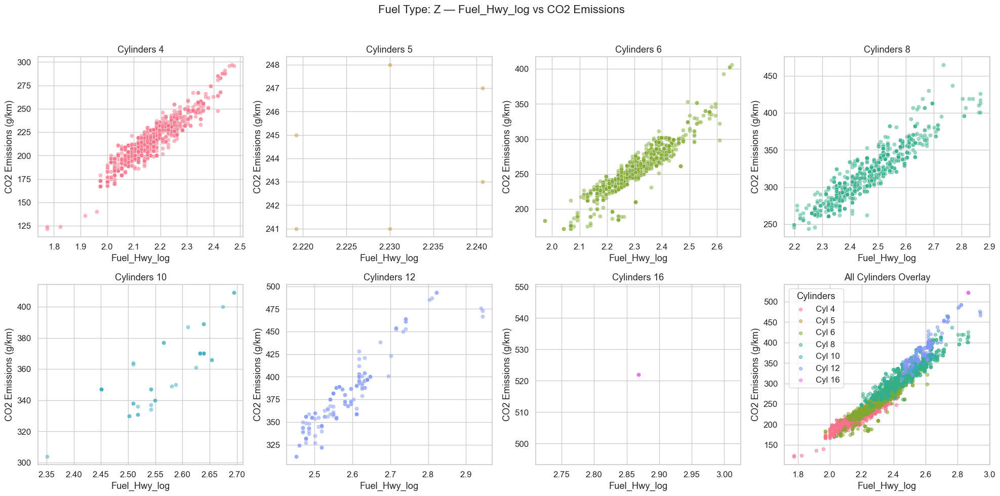

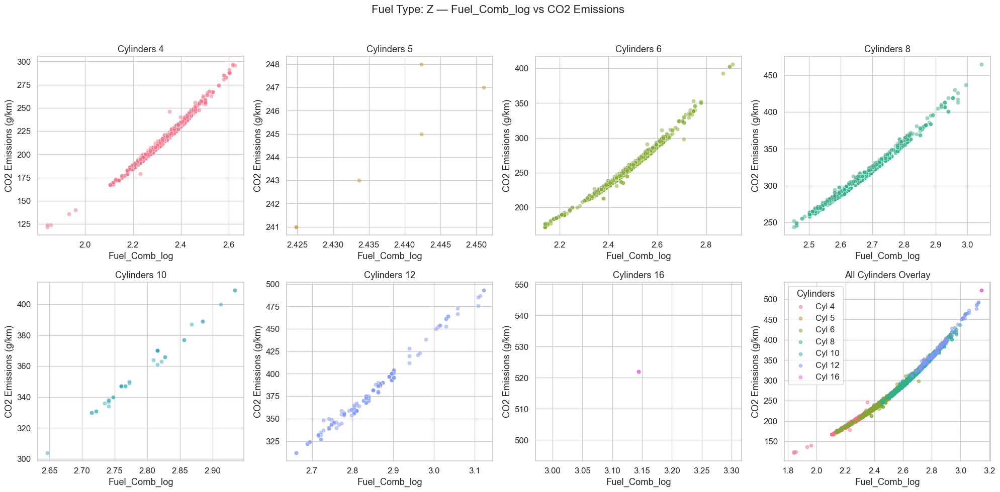

Generating plots for Fuel Type: D


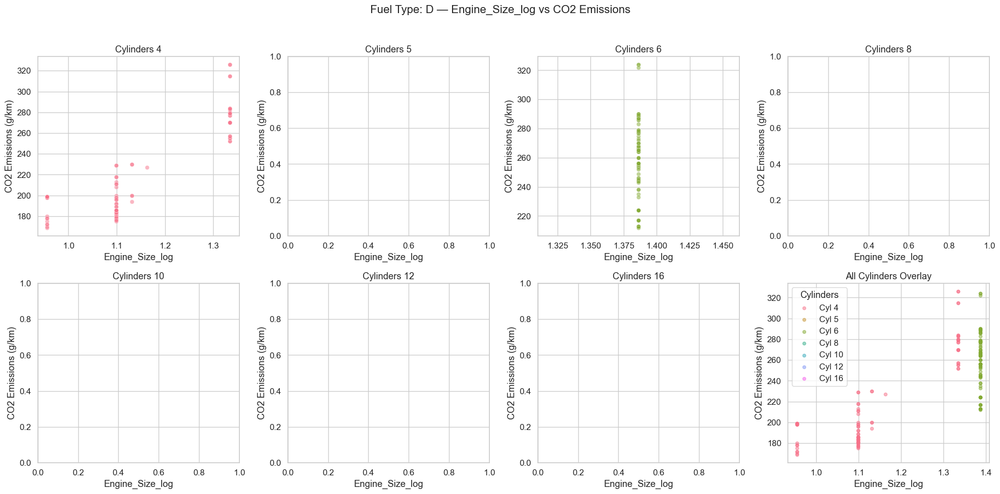

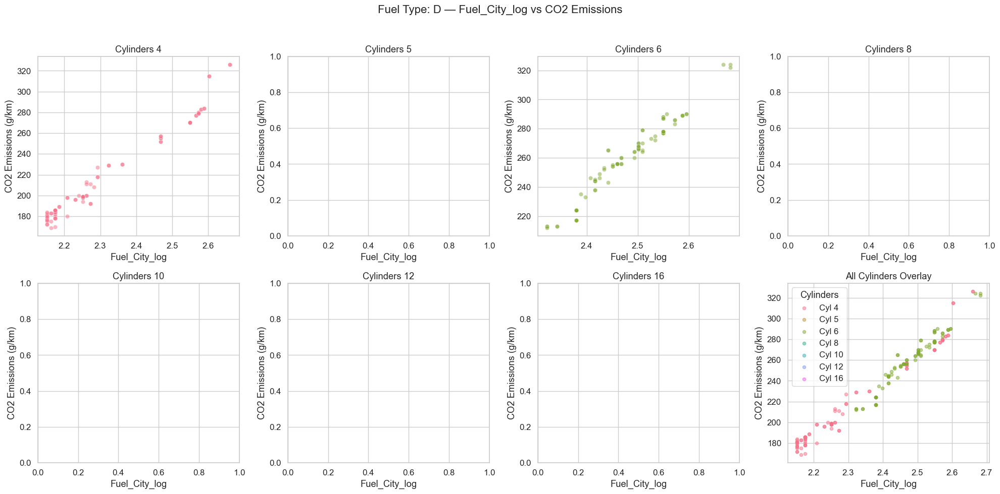

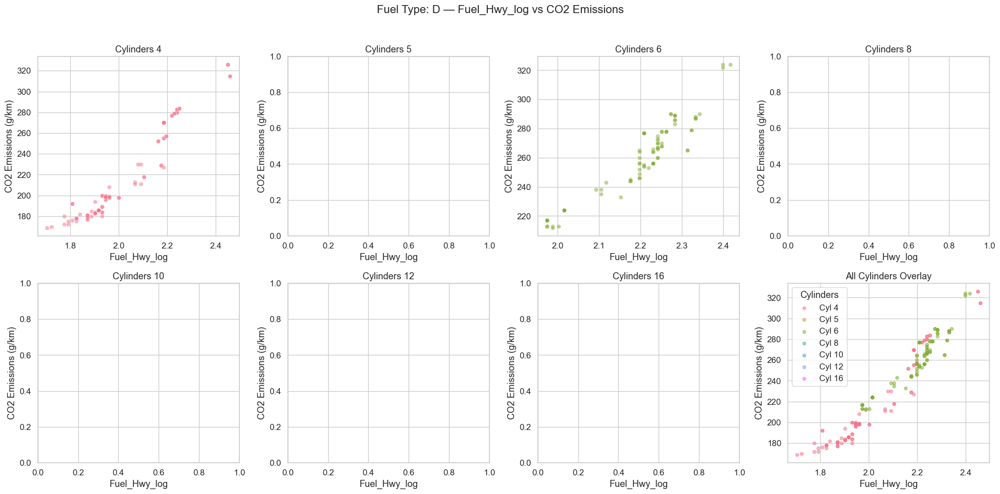

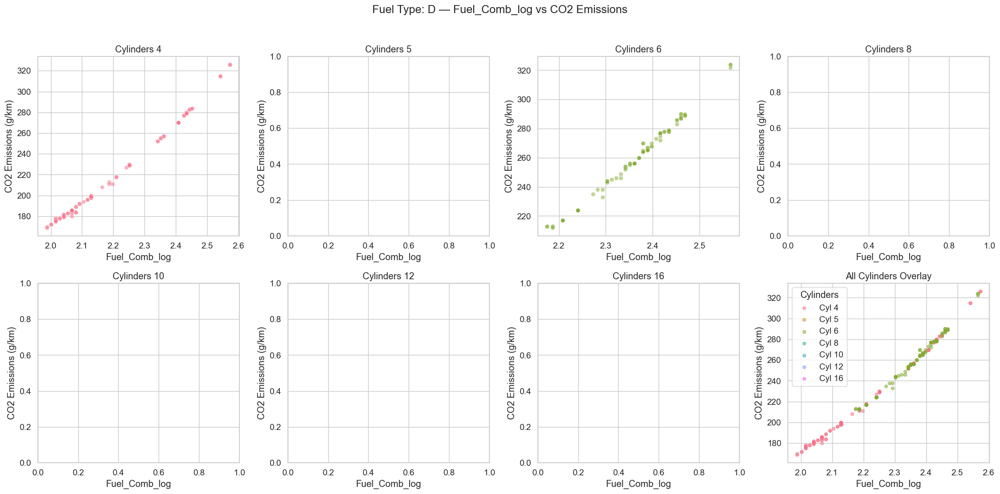

Generating plots for Fuel Type: X


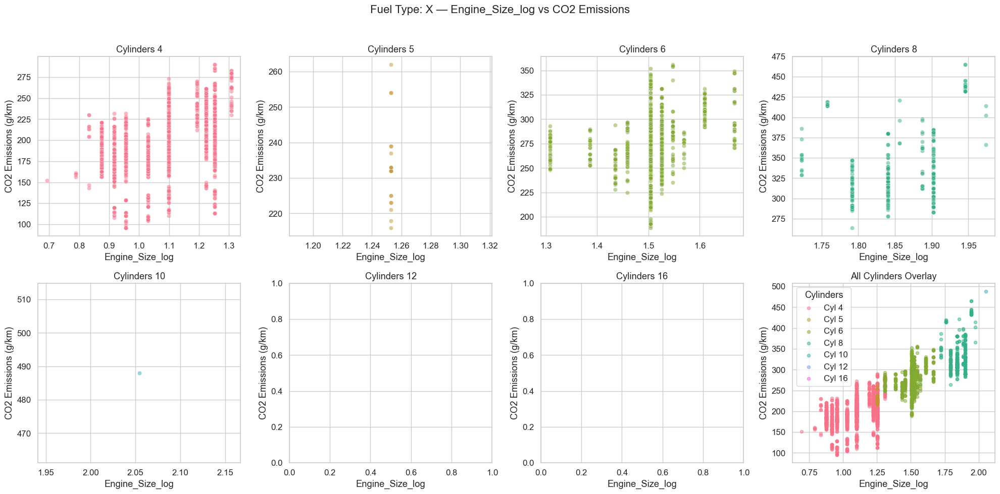

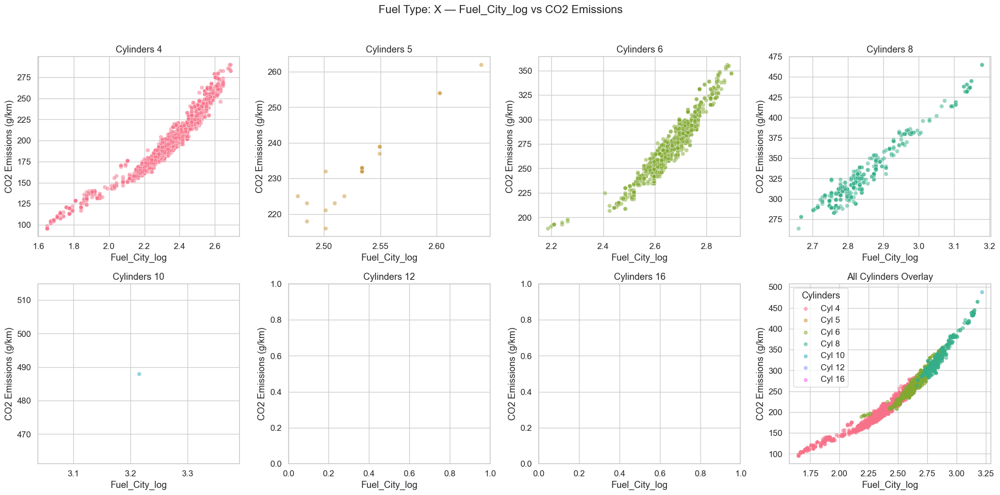

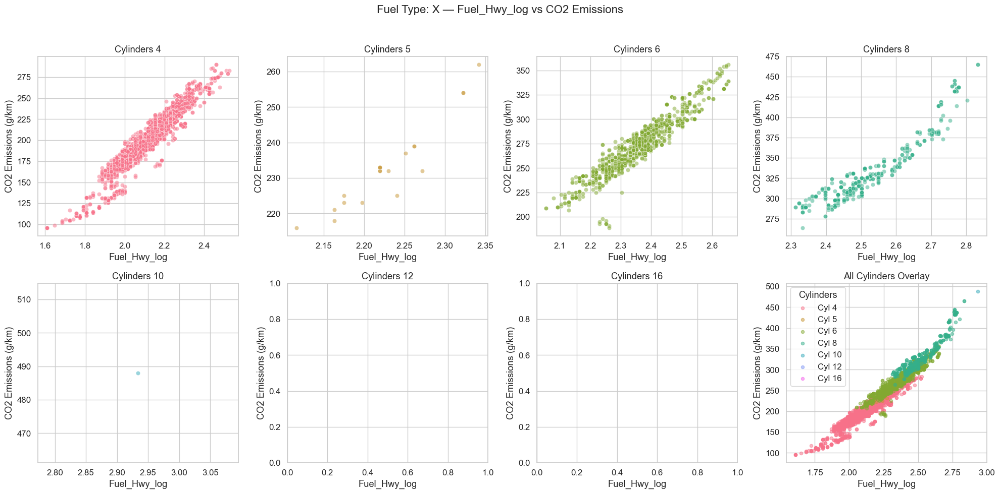

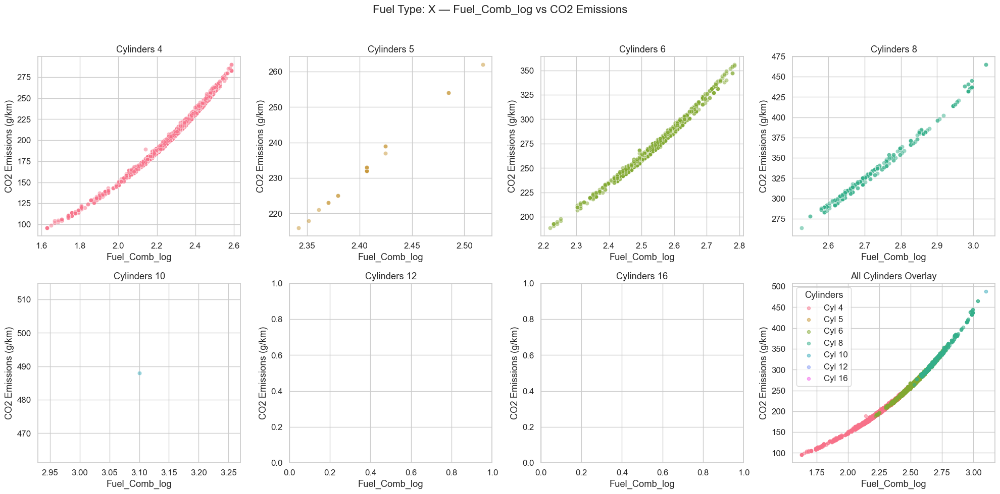

Generating plots for Fuel Type: E


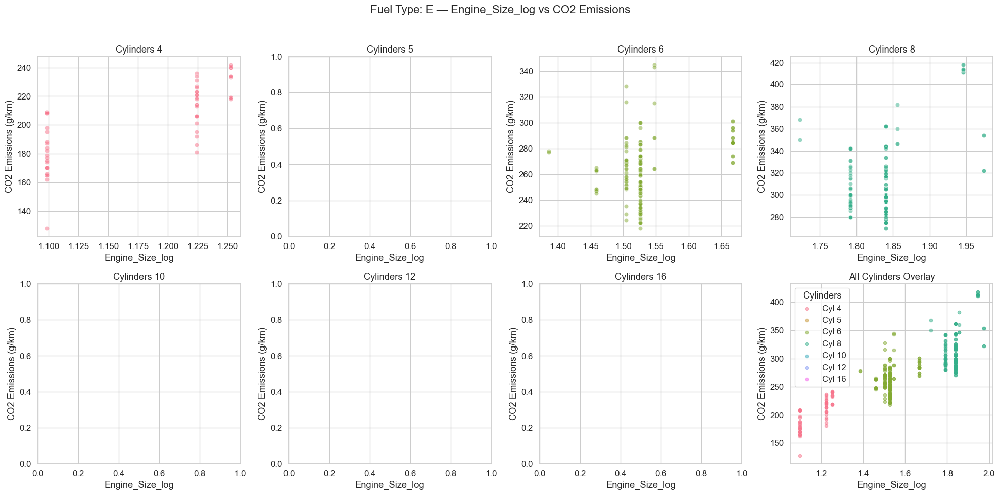

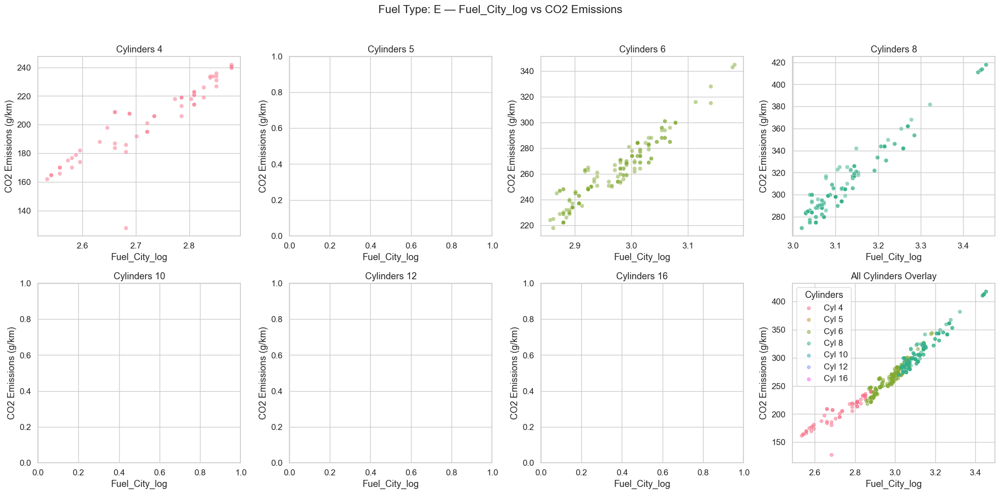

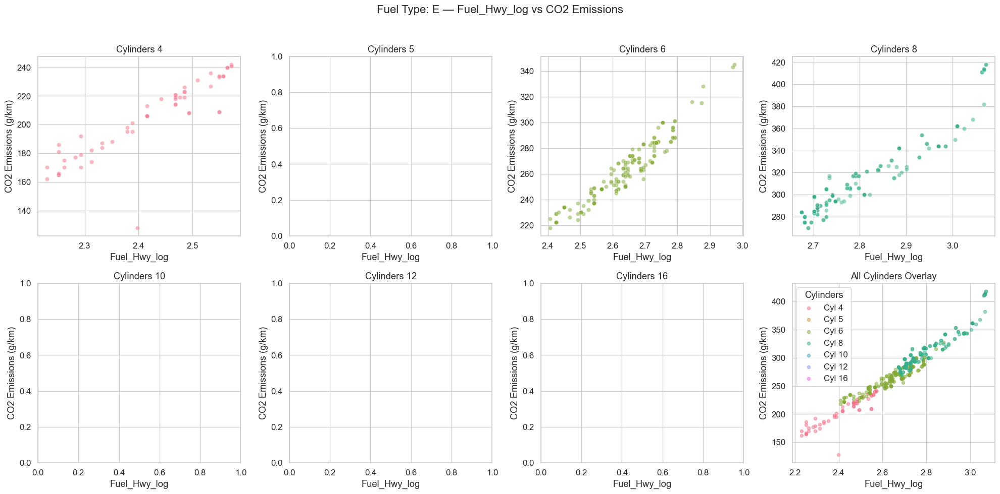

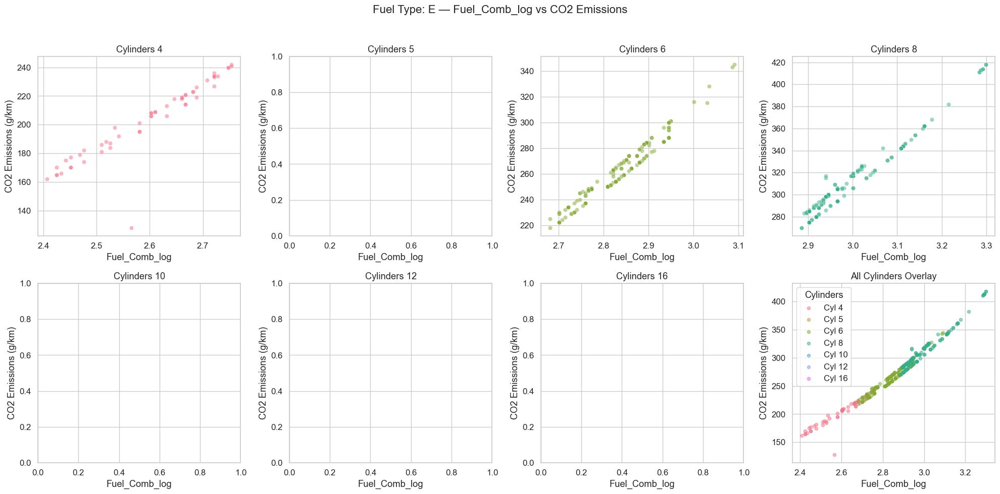

Generating plots for Fuel Type: N


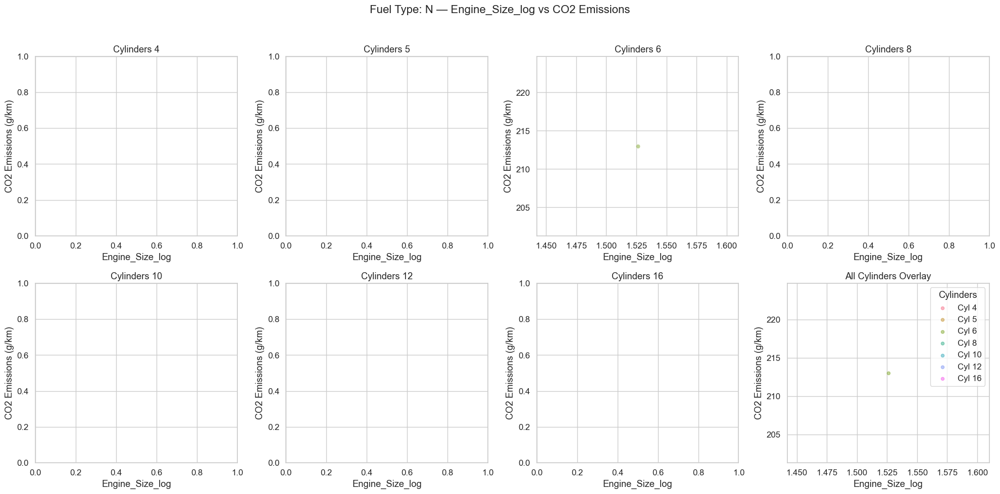

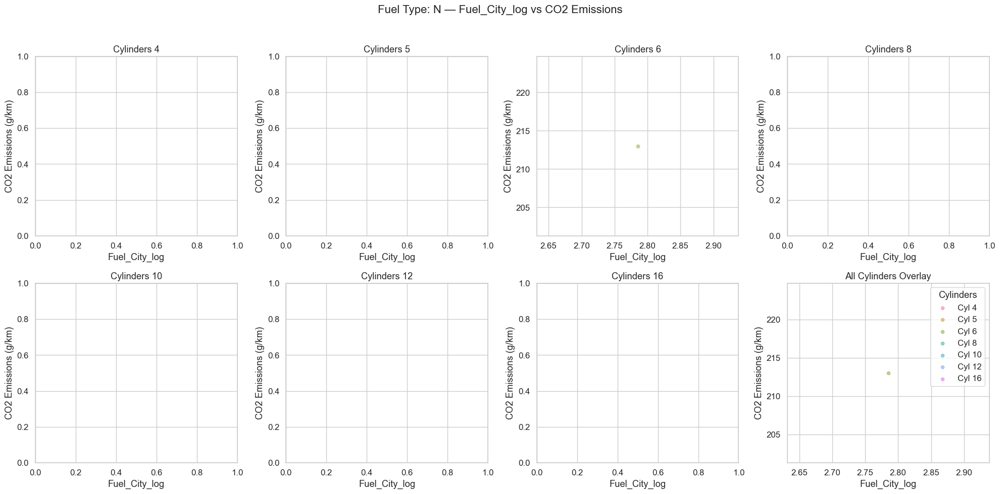

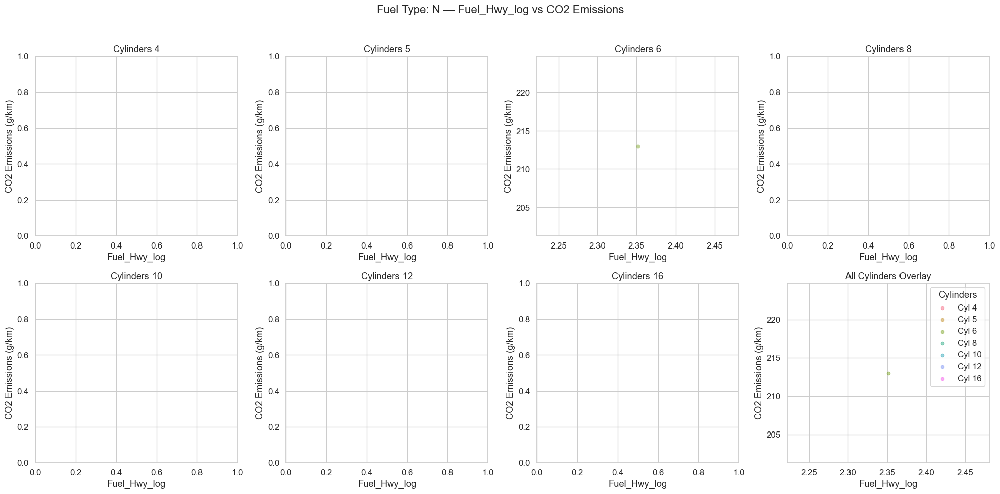

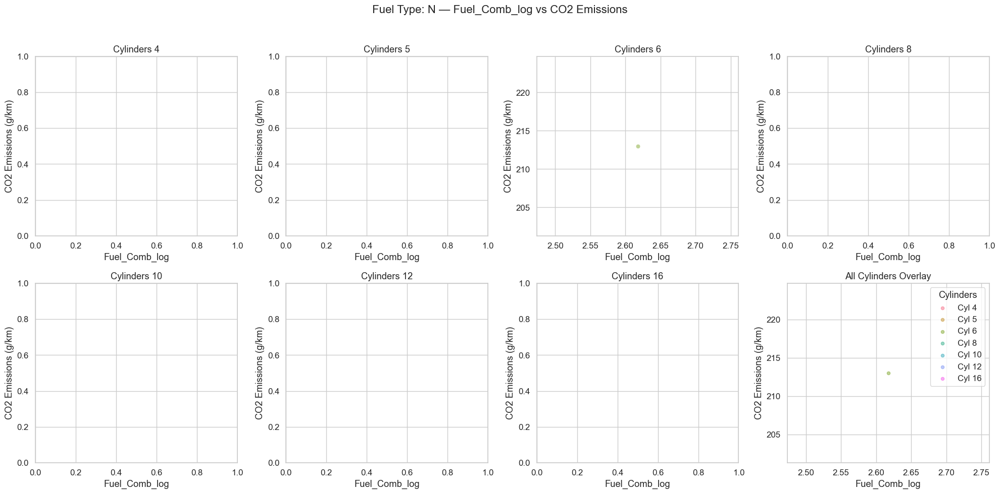

In [338]:
sns.set(style="whitegrid", font_scale=1.1)

# Features to plot against CO2
features = ['Engine_Size_log','Fuel_City_log', 'Fuel_Hwy_log', 'Fuel_Comb_log']

# Cylinder categories (from one-hot encoded columns)
cylinder_columns = ['Cylinders_4', 'Cylinders_5', 'Cylinders_6', 
                    'Cylinders_8', 'Cylinders_10', 'Cylinders_12', 'Cylinders_16']
cylinder_labels = {col: col.replace('Cylinders_', '') for col in cylinder_columns}
colors = sns.color_palette("husl", len(cylinder_columns))

# Loop through each fuel type
for fuel_type, df_fuel in fuel_type_dfs.items():
    print(f"Generating plots for Fuel Type: {fuel_type}")

    # Skip if any required feature or column is missing
    if not all(f in df_fuel.columns for f in features + cylinder_columns + ['CO2 Emissions(g/km)']):
        print(f"Skipping {fuel_type} due to missing columns.")
        continue

    for feature in features:
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
        axes = axes.flatten()

        # 1. Individual cylinder plots
        for i, col in enumerate(cylinder_columns):
            subset = df_fuel[df_fuel[col] == 1]
            sns.scatterplot(
                data=subset,
                x=feature,
                y='CO2 Emissions(g/km)',
                alpha=0.5,
                ax=axes[i],
                color=colors[i]
            )
            axes[i].set_title(f'Cylinders {cylinder_labels[col]}')
            axes[i].set_xlabel(feature)
            axes[i].set_ylabel('CO2 Emissions (g/km)')

        # 2. Combined overlay plot
        ax_combined = axes[-1]
        for i, col in enumerate(cylinder_columns):
            subset = df_fuel[df_fuel[col] == 1]
            ax_combined.scatter(
                subset[feature],
                subset['CO2 Emissions(g/km)'],
                label=f'Cyl {cylinder_labels[col]}',
                alpha=0.5,
                s=20,
                color=colors[i]
            )
        ax_combined.set_title('All Cylinders Overlay')
        ax_combined.set_xlabel(feature)
        ax_combined.set_ylabel('CO2 Emissions (g/km)')
        ax_combined.legend(title="Cylinders")

        fig.suptitle(f'Fuel Type: {fuel_type} — {feature} vs CO2 Emissions', fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

### **🔍 Modeling Strategy Decision — Fuel Type-Based Modeling**
During exploratory analysis of the dataset, we examined the relationship between fuel consumption features (e.g., Fuel_Comb_log, Fuel_City_log) and CO2 emissions. Initially, we explored this relationship across different Vehicle Classes, but the scatter plots revealed an important insight:

❗ Key Observation:
Plots like Fuel_City_log vs CO2 Emissions displayed distinct vertical bands or clusters, even when broken down by vehicle class. These bands indicated that the relationship between fuel consumption and emissions is not consistent across the entire dataset, and that separating by vehicle class does not fully eliminate this non-linear pattern.

However, when we grouped the data by Fuel Type, a different picture emerged.

✅ Breakthrough Insight:
Within each Fuel Type, the relationship between fuel consumption and CO2 emissions appeared:

More continuous

Largely linear or gently curved

Without abrupt jumps or banding artifacts

This indicated that Fuel Type is the primary driver of the different relationships between fuel consumption and CO2 emissions. In other words, different fuel types produce different emission behaviors even for similar levels of fuel usage.

✅ Conclusion:
We will build separate regression models for each Fuel Type, rather than for each Vehicle Class.

This approach offers several benefits:

Preserves linearity: Linear or polynomial models fit more cleanly within each fuel group.

Reduces noise: Eliminates the confounding caused by mixing fuel types with very different emission profiles.

Improves accuracy and interpretability: Residuals are better behaved, and model coefficients are more meaningful.

In [339]:
for fuel_code, df in fuel_type_dfs.items():
    filename = f"Fuel type {fuel_code}.csv"
    df.to_csv(filename, index=False)

print("CSV files written successfully for all fuel types.")


CSV files written successfully for all fuel types.
